In [1]:
%%HTML 
<script>
    function luc21893_refresh_cell(cell) {
        if( cell.luc21893 ) return;
        cell.luc21893 = true;
        // console.debug('New code cell found...' );
        
        var div = document.createElement('DIV');            
        cell.parentNode.insertBefore( div, cell.nextSibling );
        div.style.textAlign = 'right';
        var a = document.createElement('A');
        div.appendChild(a);
        a.href='#'
        a.luc21893 = cell;
        a.setAttribute( 'onclick', "luc21893_toggle(this); return false;" );

        cell.style.visibility='hidden';
        cell.style.position='absolute';
        a.innerHTML = '[show code]';        
                
    }
    function luc21893_refresh() {                
        if( document.querySelector('.code_cell .input') == null ) {            
            // it apeears that I am in a exported html
            // hide this code
            var codeCells = document.querySelectorAll('.jp-InputArea')
            codeCells[0].style.visibility = 'hidden';
            codeCells[0].style.position = 'absolute';                        
            for( var i = 1; i < codeCells.length; i++ ) {
                luc21893_refresh_cell(codeCells[i].parentNode)
            }
            window.onload = luc21893_refresh;
        }                 
        else {
            // it apperas that I am in a jupyter editor
            var codeCells = document.querySelectorAll('.code_cell .input')
            for( var i = 0; i < codeCells.length; i++ ) {
                luc21893_refresh_cell(codeCells[i])
            }            
            window.setTimeout( luc21893_refresh, 1000 )
        }        
    }
    
    function luc21893_toggle(a) {
        if( a.luc21893.style.visibility=='hidden' ) {
            a.luc21893.style.visibility='visible';        
            a.luc21893.style.position='';
            a.innerHTML = '[hide code]';
        }
        else {
            a.luc21893.style.visibility='hidden';        
            a.luc21893.style.position='absolute';
            a.innerHTML = '[show code]';
        }
    }
    
    luc21893_refresh()
</script>

<b style="font-size:3vw">Etude prévisionnelle des ventes</b>
<br> <br> 
<b style="font-size:1vw">Abdelghafour Ait bennassar, Salma Mounji</b>

<h1>Table des matières<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Importation-des-outils-nécessaires" data-toc-modified-id="Importation-des-outils-nécessaires-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Importation des outils nécessaires</a></span></li><li><span><a href="#Analyse-exploratoire-des-données" data-toc-modified-id="Analyse-exploratoire-des-données-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Analyse exploratoire des données</a></span><ul class="toc-item"><li><span><a href="#Importation-de-données" data-toc-modified-id="Importation-de-données-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Importation de données</a></span></li><li><span><a href="#Description-de-données" data-toc-modified-id="Description-de-données-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Description de données</a></span></li><li><span><a href="#Le-corrélogramme-:-visualisation-de-la-matrice-de-corrélation" data-toc-modified-id="Le-corrélogramme-:-visualisation-de-la-matrice-de-corrélation-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Le corrélogramme : visualisation de la matrice de corrélation</a></span></li><li><span><a href="#clustering-:-Regroupement-des-produits" data-toc-modified-id="clustering-:-Regroupement-des-produits-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>clustering : Regroupement des produits</a></span><ul class="toc-item"><li><span><a href="#Normalisation-des-variables" data-toc-modified-id="Normalisation-des-variables-2.4.1"><span class="toc-item-num">2.4.1&nbsp;&nbsp;</span>Normalisation des variables</a></span></li><li><span><a href="#Réduction-de-la-dimension-:-Analyse-en-composantes-principales-(ACP)" data-toc-modified-id="Réduction-de-la-dimension-:-Analyse-en-composantes-principales-(ACP)-2.4.2"><span class="toc-item-num">2.4.2&nbsp;&nbsp;</span>Réduction de la dimension : Analyse en composantes principales (ACP)</a></span></li><li><span><a href="#Clustering-:-K-means" data-toc-modified-id="Clustering-:-K-means-2.4.3"><span class="toc-item-num">2.4.3&nbsp;&nbsp;</span>Clustering : K-means</a></span></li></ul></li><li><span><a href="#Analyse-de-données" data-toc-modified-id="Analyse-de-données-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Analyse de données</a></span><ul class="toc-item"><li><span><a href="#Statistiques-descriptives-:" data-toc-modified-id="Statistiques-descriptives-:-2.5.1"><span class="toc-item-num">2.5.1&nbsp;&nbsp;</span>Statistiques descriptives :</a></span></li><li><span><a href="#Visualisation-de-la-tendance-et-saisonnalité" data-toc-modified-id="Visualisation-de-la-tendance-et-saisonnalité-2.5.2"><span class="toc-item-num">2.5.2&nbsp;&nbsp;</span>Visualisation de la tendance et saisonnalité</a></span></li></ul></li></ul></li><li><span><a href="#Modélisation-statistique-univarié-:-ARIMA" data-toc-modified-id="Modélisation-statistique-univarié-:-ARIMA-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Modélisation statistique univarié : ARIMA</a></span><ul class="toc-item"><li><span><a href="#Analyse-de-la-stationnarité" data-toc-modified-id="Analyse-de-la-stationnarité-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Analyse de la stationnarité</a></span><ul class="toc-item"><li><span><a href="#Analyse-d’autocorrélation" data-toc-modified-id="Analyse-d’autocorrélation-3.1.1"><span class="toc-item-num">3.1.1&nbsp;&nbsp;</span>Analyse d’autocorrélation</a></span></li><li><span><a href="#Tests-de-stationnarité" data-toc-modified-id="Tests-de-stationnarité-3.1.2"><span class="toc-item-num">3.1.2&nbsp;&nbsp;</span>Tests de stationnarité</a></span></li><li><span><a href="#Stationnarisation-des-séries" data-toc-modified-id="Stationnarisation-des-séries-3.1.3"><span class="toc-item-num">3.1.3&nbsp;&nbsp;</span>Stationnarisation des séries</a></span></li></ul></li><li><span><a href="#Prévisions-par-ARIMA" data-toc-modified-id="Prévisions-par-ARIMA-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Prévisions par ARIMA</a></span><ul class="toc-item"><li><span><a href="#selection-des-meilleurs-modèles" data-toc-modified-id="selection-des-meilleurs-modèles-3.2.1"><span class="toc-item-num">3.2.1&nbsp;&nbsp;</span>selection des meilleurs modèles</a></span></li><li><span><a href="#Prévisions-statiques-et-dynamiques" data-toc-modified-id="Prévisions-statiques-et-dynamiques-3.2.2"><span class="toc-item-num">3.2.2&nbsp;&nbsp;</span>Prévisions statiques et dynamiques</a></span></li><li><span><a href="#Diagnostic-des-résidus" data-toc-modified-id="Diagnostic-des-résidus-3.2.3"><span class="toc-item-num">3.2.3&nbsp;&nbsp;</span>Diagnostic des résidus</a></span></li></ul></li></ul></li><li><span><a href="#Modélisation-univarié-par-l’approche-d’apprentissage-automatique" data-toc-modified-id="Modélisation-univarié-par-l’approche-d’apprentissage-automatique-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Modélisation univarié par l’approche d’apprentissage automatique</a></span><ul class="toc-item"><li><span><a href="#Features-engineering" data-toc-modified-id="Features-engineering-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Features engineering</a></span></li><li><span><a href="#Modèles-de-régression" data-toc-modified-id="Modèles-de-régression-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Modèles de régression</a></span><ul class="toc-item"><li><span><a href="#Régression-linéaire-multiple" data-toc-modified-id="Régression-linéaire-multiple-4.2.1"><span class="toc-item-num">4.2.1&nbsp;&nbsp;</span>Régression linéaire multiple</a></span></li><li><span><a href="#modèles-de-régularisation-:-Ridge-et-Lasso" data-toc-modified-id="modèles-de-régularisation-:-Ridge-et-Lasso-4.2.2"><span class="toc-item-num">4.2.2&nbsp;&nbsp;</span>modèles de régularisation : Ridge et Lasso</a></span></li></ul></li><li><span><a href="#Gradient-Boosting-:-XGBoost" data-toc-modified-id="Gradient-Boosting-:-XGBoost-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Gradient Boosting : XGBoost</a></span></li><li><span><a href="#Comparaison-des-modèles-univariés" data-toc-modified-id="Comparaison-des-modèles-univariés-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Comparaison des modèles univariés</a></span></li></ul></li><li><span><a href="#Modélisation-multivariée-:-Vector-AutoRegressif-Moving-Average-(VARMA)" data-toc-modified-id="Modélisation-multivariée-:-Vector-AutoRegressif-Moving-Average-(VARMA)-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Modélisation multivariée : Vector AutoRegressif Moving Average (VARMA)</a></span></li></ul></div>

# Importation des outils nécessaires

In [1]:
from IPython.display import display
from math import ceil, sqrt
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import statsmodels.api as sm
import joblib
import random

# colors generator
from itertools import cycle

color_pal = plt.rcParams['axes.prop_cycle'].by_key()['color']
color_cycle = cycle(plt.rcParams['axes.prop_cycle'].by_key()['color'])

# Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose

# Clustering Algorithms
from tslearn.barycenters import dtw_barycenter_averaging
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.cluster import KMeans

# ARIMA
from pmdarima import auto_arima
from pmdarima.utils import diff_inv
from pmdarima.arima.utils import ndiffs, nsdiffs

# Machine learning
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV
from sklearn.model_selection import TimeSeriesSplit

# VARMAX
from autots import AutoTS

# metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_percentage_error, mean_absolute_error, mean_squared_error

# assert reproducibility
random.seed(7)
np.random.seed(7)
print("setup complete")

setup complete


In [10]:
import warnings
warnings.filterwarnings('ignore')

import inspect
def get_default_args(func):
    signature = inspect.signature(func)
    return {
        k: v.default
        for k, v in signature.parameters.items()
        if v.default is not inspect.Parameter.empty
    }

from functools import wraps
class ForceRunException(Exception): pass
import joblib
def meta_decorator(joblib_Filename, compress=False):
    def real_decorator(function):
        @wraps(function)
        def wrapper(*args, **kwargs):
            force_run_arg = kwargs.get('force_run', None)
            default_args = get_default_args(function)
            default_force_run = default_args.get('force_run', False)
            if force_run_arg is None:
                force_run = default_force_run
            else :
                force_run = force_run_arg
            assert force_run in {True, False}
            filename = joblib_Filename
            if compress:
                filename += '.z'
            try:
                if force_run:
                    raise ForceRunException
                My_Model = joblib.load(filename)
                warnings.warn("function call and arguments are not evaluated !!")
                print("data found and successfully imported,",
                      "No need to call the function")
            except (ForceRunException, FileNotFoundError) as e:
                if e.__class__ == ForceRunException:
                    print("Explicit execution requested,", end=' ')
                else:
                    print("data not found,", end=' ')
                print("Executing calculations...")
                My_Model = function(*args, **kwargs)
                print("calculations are done.", "saving data to " + filename)
                joblib.dump(My_Model, filename)
                print("the data is now saved")
            return My_Model
        return wrapper
    return real_decorator

from time import sleep
@meta_decorator("joblib_test.joblib")
def test_save(number, times, *, force_run=False):
    """repeat number in list for number of times"""
    sleep(3) # simulate waiting
    to_save = [number for _ in range(times)]
    return to_save

def pretty_df(data_f):
    df = data_f.copy()
    df["Series"] = df.index
    cols = df.columns.tolist()
    cols = cols[-1:] + cols[:-1]
    df = df[cols]
    return df.style.hide_index().set_properties(
        **{'color': 'black  !important',
           'border': '1px black solid !important', "text-align": "left"}
    ).set_table_styles([{
        'selector': 'th',
        'props': [('border', '1px black solid !important'), ("text-align", "center")]
    }]).set_properties(
        subset=[cols[0]],
        **{'font-weight': 'bold'}
    )

def remove_axes(n_used_axes, all_axs):
    if n_used_axes % 2:
        all_axs = all_axs.flatten()
        size = len(all_axs)
        for useless_ax in all_axs.flatten()[-(size - n_used_axes):]:
            useless_ax.axis('off')

 # Analyse exploratoire des données
 ## Importation de données

In [3]:
sales = pd.read_csv('70prod_data.csv', index_col=0, parse_dates=True)
display(sales.head())
display(sales.describe().T)

,P_1,P_2,P_3,P_4,P_5,P_6,P_7,P_8,P_9,P_10,...,P_61,P_62,P_63,P_64,P_65,P_66,P_67,P_68,P_69,P_70
2014-07-31,2669,3603,3506,1274,1528,2244,1460,2523,2045,1713,...,1721,2506,3011,1039,1374,1840,1359,1407,1108,1544
2014-08-31,2794,3405,3279,1449,1526,1970,1423,2660,2065,1774,...,1906,2701,3081,1134,1331,1877,1424,1503,1061,1490
2014-09-30,2289,3434,3238,1426,1484,1877,1369,2581,1775,1875,...,1979,2618,3004,1160,1327,1827,1357,1449,1049,1465
2014-10-31,2310,3277,3088,1404,1500,1615,1159,2326,1614,1893,...,1982,2693,3215,1180,1369,1883,1384,1446,1050,1584
2014-11-30,2559,3396,2921,1329,1384,1796,1395,2351,1749,1678,...,2025,2607,3280,1065,1286,1766,1345,1377,988,1518


,count,mean,std,min,25%,50%,75%,max
P_1,63.0,3510.761905,656.364885,2289.0,2997.0,3546.0,3992.0,4885.0
P_2,63.0,4341.333333,671.591874,3152.0,3848.0,4464.0,4810.0,5873.0
P_3,63.0,4448.523810,693.352814,2909.0,4105.5,4607.0,4943.0,5644.0
P_4,63.0,2267.888889,435.481014,1274.0,2065.0,2371.0,2541.5,2974.0
P_5,63.0,2390.111111,489.206009,1252.0,2198.5,2492.0,2705.5,3327.0
...,...,...,...,...,...,...,...,...
P_66,63.0,2075.317460,231.814082,1742.0,1877.5,2035.0,2231.0,2591.0
P_67,63.0,1685.857143,275.337556,1294.0,1424.0,1645.0,1928.5,2199.0
P_68,63.0,1649.063492,303.335058,748.0,1427.5,1562.0,1915.5,2243.0
P_69,63.0,1420.682540,313.456218,766.0,1164.0,1538.0,1658.5,1968.0


 ## Description de données 
 Initialement, on disposait des données sous forme d’un classeur Excel contenant cinq feuilles où chaque feuille contient les ventes mensuelles des produits dans un an, pour obtenir les données sous la forme requise pour l’étude, on a joint les données des cinq années pour obtenir un jeu de données dans lequel les lignes représentent les dates (63 mois) et les colonnes représentent les produits (70 produits).

 ## Le corrélogramme : visualisation de la matrice de corrélation

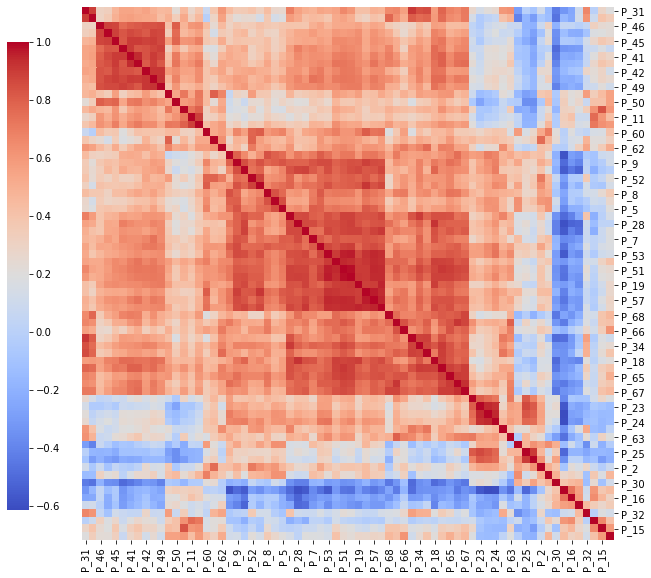

In [8]:
#ax = sns.heatmap(sales.corr())
cg = sns.clustermap(sales.corr(), figsize=(10, 10),
                    cbar_pos=(.1, .1, .03, .65), cmap="coolwarm")
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
plt.show()

 On observe une forte correlation entre certains groupes de produits, ce qui suggère qu'on peut les classifier selon leurs comportements de ventes.


 ## clustering : Regroupement des produits
 ### Normalisation des variables
 L'un des problèmes qu'on doit traiter avant de commencer le partitionnement (clustering) est l'échelle de la série. Sans normaliser les données, les séries qui se ressemblent seront vues si différentes les unes des autres et affecteront la précision du processus de clustering. Nous pouvons voir l'effet de la normalisation dans les images suivantes.

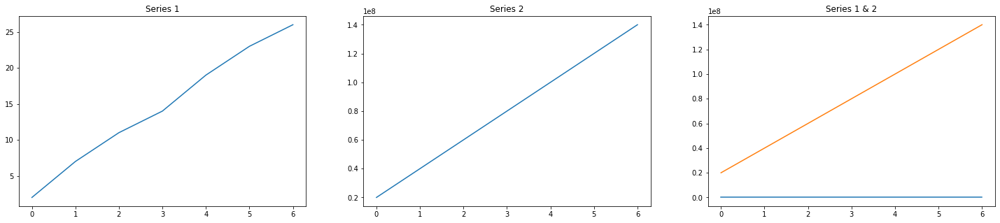

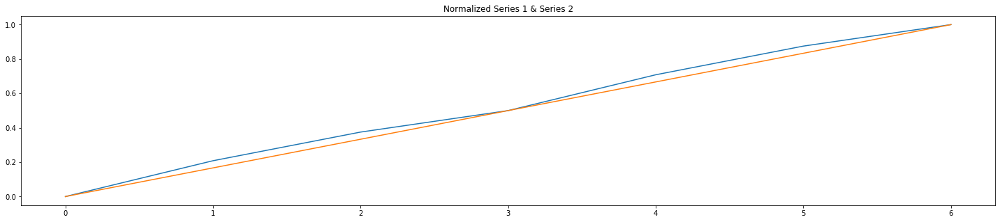

In [9]:
a = [[2], [7], [11], [14], [19], [23], [26]]
b = [[20000000], [40000000], [60000000], [80000000],
     [100000000], [120000000], [140000000]]
fig, axs = plt.subplots(1, 3, figsize=(25, 5))
axs[0].plot(a)
axs[0].set_title("Series 1")
axs[1].plot(b)
axs[1].set_title("Series 2")
axs[2].plot(a)
axs[2].plot(b)
axs[2].set_title("Series 1 & 2")
plt.figure(figsize=(25, 5))
plt.plot(MinMaxScaler().fit_transform(a))
plt.plot(MinMaxScaler().fit_transform(b))
plt.title("Normalized Series 1 & Series 2")
plt.show()

In [10]:
mySeries = sales.copy()
scaler = MinMaxScaler()
mySeries = MinMaxScaler().fit_transform(mySeries).T

 ### Réduction de la dimension : Analyse en composantes principales (ACP)

 Afin de regrouper nos séries avec des k-moyennes, les indices temporels des séries chronologiques seront considérés comme des caractéristiques différentes et seront les dimensions des points de données(les séries).

 Puisque la longueur des série temporelles en pratique est souvent importante, un autre problème auquel on doit faire face est la malédiction de la dimensionnalité,ce terme a été inventé pour la première fois par Richard E. Bellman lors de l'examen des problèmes de programmation dynamique. Cela signifie essentiellement que lorsque la dimensionnalité des données augmente, la distance entre les points de données augmente également. Ainsi, ce changement de mesure de la distance affecte gravement les algorithmes basés sur la distance.

 Pour résoudre ce problème, on va effectuer une analyse en composantes principales ACP avant le partitionnement.

In [11]:
pca = PCA(n_components=2)
pca_res = pca.fit_transform(mySeries)

 Désormais avec moins de dimensions qu'avant, nous pouvons voir comment nos séries se répartissent en 2 dimensions.

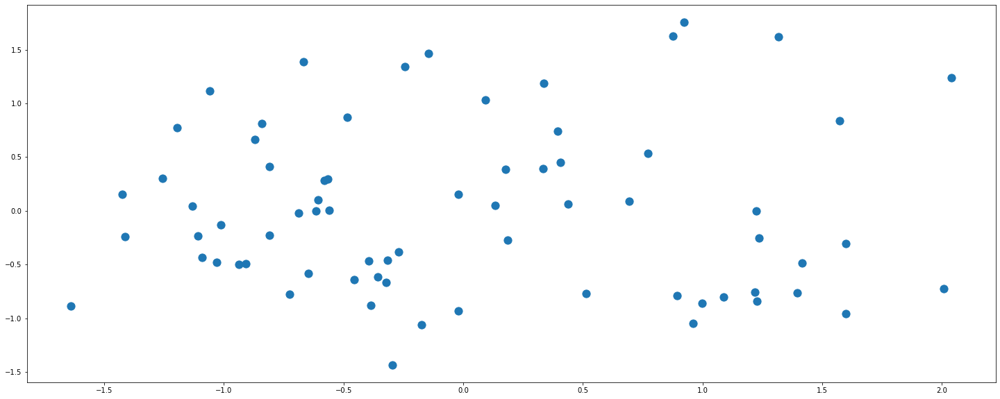

In [12]:
plt.figure(figsize=(25, 10))
plt.scatter(pca_res[:, 0], pca_res[:, 1], s=125)
plt.show()

 ### Clustering : K-means
 Le partitionnement en k-moyennes (ou k-means en anglais) est une méthode de partitionnement de données et un problème d'optimisation combinatoire. Étant donnés des points et un entier k, le problème est de diviser les points en k groupes, souvent appelés clusters, de façon à minimiser une certaine fonction. On considère la distance d'un point à la moyenne des points de son cluster (centroid) ; la fonction à minimiser est la somme des carrés de ces distances,la distance euclidienne est souvent utilisée.

 Initialement on va éstimer le nombre de clusters requis par la racine du nombre des points (séries), on obtient 9 clusters.

In [13]:
cluster_count = ceil(sqrt(len(mySeries)))
cluster_count

9

 et on va appliquer la méthode de Kmeans sur le résultat de l'ACP.

In [ ]:
@meta_decorator("kmeans_object.joblib")
def create_fit_kmeans(pca_res, cluster_count):
    kmeans = KMeans(n_clusters=cluster_count, max_iter=50000)
    kmeans.fit(pca_res)
    return kmeans
create_fit_kmeans(pca_res, cluster_count)
labels = kmeans.predict(pca_res)

 Après l'entrainement du modèle, on a présenté les résultats. Pour chaque cluster, on a tracé les séries en gris, et afin de visualiser le mouvement et le comportement des séries appartenant au même cluster, on a pris la moyenne du cluster et tracé cette série moyenne en rouge.

In [15]:
labels

array([1, 3, 7, 4, 1, 3, 4, 1, 4, 3, 2, 2, 0, 2, 6, 0, 6, 5, 8, 0, 7, 6,
       7, 7, 7, 3, 7, 4, 4, 0, 1, 6, 4, 8, 8, 6, 5, 1, 8, 0, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 8, 1, 4, 4, 4, 1, 4, 8, 8, 6, 8, 6, 6, 8, 5, 6,
       5, 1, 4, 6])

In [16]:
clusters = [[] for _ in range(cluster_count)]
for i, lab in enumerate(labels):
    clusters[lab].append(i)
clusters

[[12, 15, 19, 29, 39],
 [0, 4, 7, 30, 37, 51, 55, 67],
 [10, 11, 13, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
 [1, 5, 9, 25],
 [3, 6, 8, 27, 28, 32, 52, 53, 54, 56, 68],
 [17, 36, 64, 66],
 [14, 16, 21, 31, 35, 59, 61, 62, 65, 69],
 [2, 20, 22, 23, 24, 26],
 [18, 33, 34, 38, 50, 57, 58, 60, 63]]

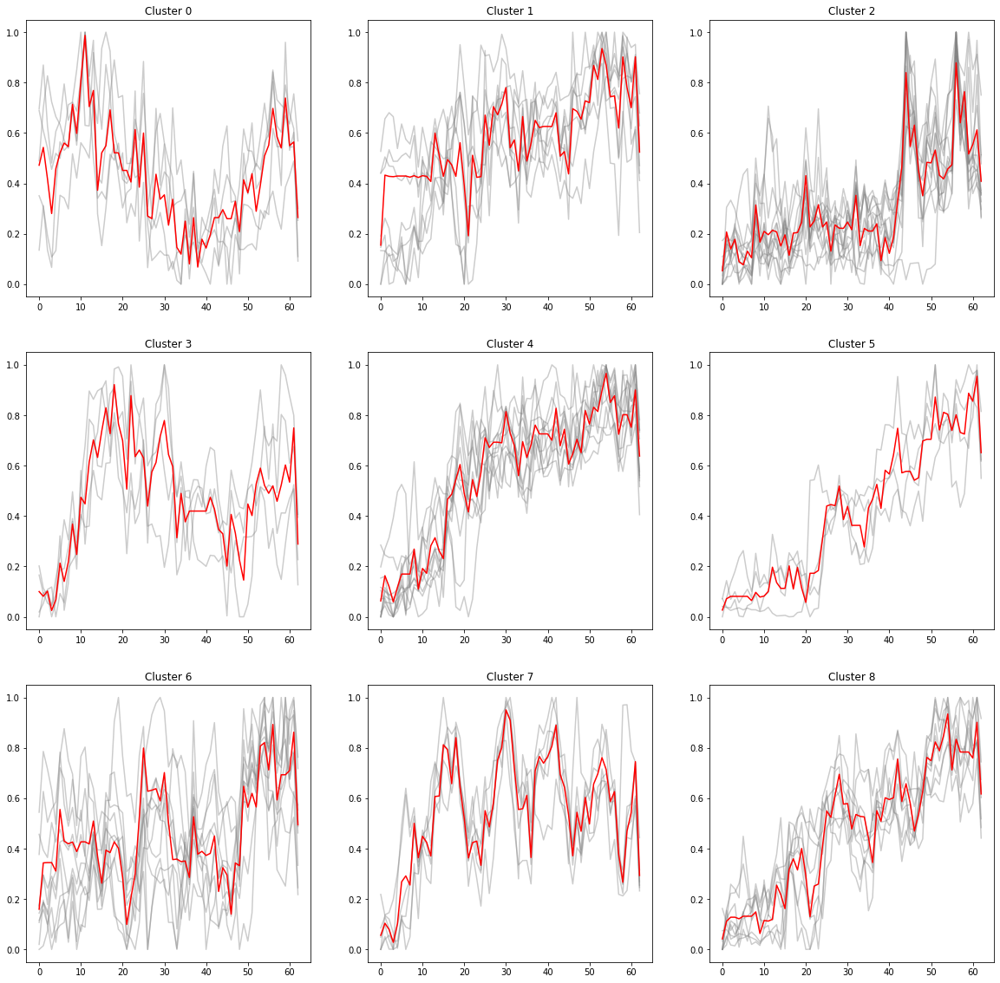

In [17]:
plot_count = ceil(sqrt(cluster_count))

fig, axs = plt.subplots(plot_count, plot_count, figsize=(20, 20))
axs = axs.flatten()
for i, cluster in enumerate(clusters):
    pd.DataFrame(mySeries).T.iloc[:, cluster].plot(
        ax=axs[i], c="gray", alpha=0.4, legend=False)
    if len(cluster) > 0:
        axs[i].plot(dtw_barycenter_averaging(
            pd.DataFrame(mySeries).iloc[cluster]), c="red")
    axs[i].set_title("Cluster "+str(i))
plt.show()

 Nous pouvons voir la distribution des séries chronologiques en clusters dans le graphique suivant.

 les séries semblent uniformement distribuées aux clusters.

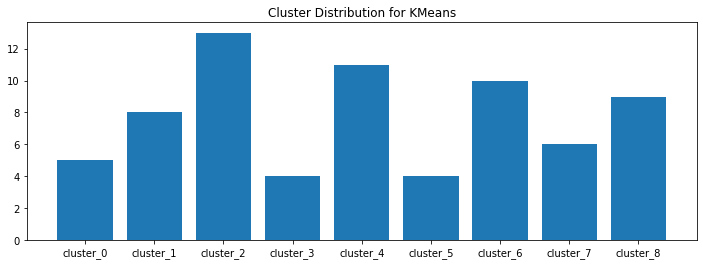

In [18]:
clusters_c = list(map(len, clusters))
clusters_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(12, 4))
plt.title("Cluster Distribution for KMeans")
plt.bar(clusters_n, clusters_c)
plt.show()

 Pour bénéficier de partitionnement qu'on a fait, il est nécessaire de lister pour chaque cluster, les séries qui lui appartiennent.

In [19]:
for cluster, cluster_n in zip(clusters, clusters_n):
    #     print(cluster_n, ':', [sales.columns[p] for p in cluster])
    print(cluster_n+':', ', '.join(['P_'+str(p) for p in cluster]))

cluster_0: P_12, P_15, P_19, P_29, P_39
cluster_1: P_0, P_4, P_7, P_30, P_37, P_51, P_55, P_67
cluster_2: P_10, P_11, P_13, P_40, P_41, P_42, P_43, P_44, P_45, P_46, P_47, P_48, P_49
cluster_3: P_1, P_5, P_9, P_25
cluster_4: P_3, P_6, P_8, P_27, P_28, P_32, P_52, P_53, P_54, P_56, P_68
cluster_5: P_17, P_36, P_64, P_66
cluster_6: P_14, P_16, P_21, P_31, P_35, P_59, P_61, P_62, P_65, P_69
cluster_7: P_2, P_20, P_22, P_23, P_24, P_26
cluster_8: P_18, P_33, P_34, P_38, P_50, P_57, P_58, P_60, P_63


 L’un des avantages que nous offre le regroupement effectué est l’exploitation de l’information disponible non seulement sur les ventes du produit qu’on souhaite prévoir, mais également l’information sur les produits ayant un comportement de ventes similaire (produits appartenant au même groupe).

 On a selectionné le produit le plus proche du centroide de chaque cluster, autrement dit le plus proche aux autres produits au même groupe.

In [20]:
closest, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, pca_res)
closest

array([29, 37, 46,  1, 54, 36, 21, 20, 63], dtype=int64)

 Pour visualiser ce résultat, on a tracé l'ensemble des points ainsi que les centres des groupes (étoiles), le point le plus proche de chaque centre est présenté en gris.

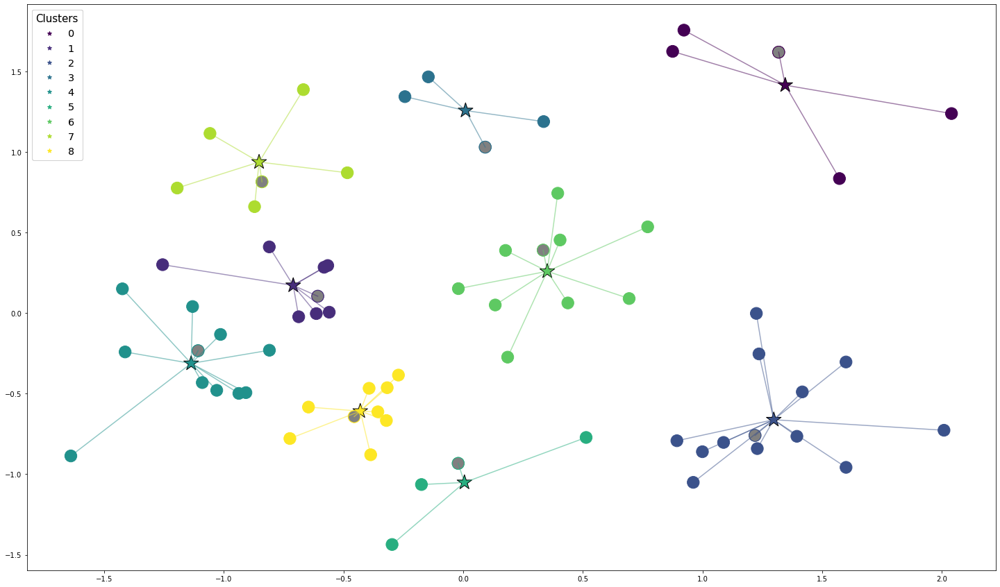

In [21]:
fig, ax = plt.subplots(figsize=(25, 15))
ax.scatter(pca_res[:, 0], pca_res[:, 1], c=labels, s=300)
sc = ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[
                :, 1],             marker='*', c=np.unique(labels), edgecolors='black', s=500, label=np.unique(labels))
legend1 = ax.legend(*sc.legend_elements(),
                    loc="upper left", title="Clusters", fontsize="x-large")
legend1.get_title().set_fontsize('15')
ax.add_artist(legend1)

ax.scatter(pca_res[closest, 0], pca_res[closest, 1], c='grey',
           edgecolors=[sc.to_rgba(lab) for lab in np.unique(labels)], s=300)

for cluster_lab, cluster_x, cluster_y in zip(np.unique(labels), kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1]):
    for pt_lab, pt_x, pt_y in zip(labels, pca_res[:, 0], pca_res[:, 1]):
        if cluster_lab == pt_lab:
            x, y = [cluster_x, pt_x], [cluster_y, pt_y]
            ax.plot(x, y, c=sc.to_rgba(cluster_lab), alpha=0.5)

 pour re vérifier ces résultats, on peut voir que les séries choisis sont centrées pour chaque groupe.

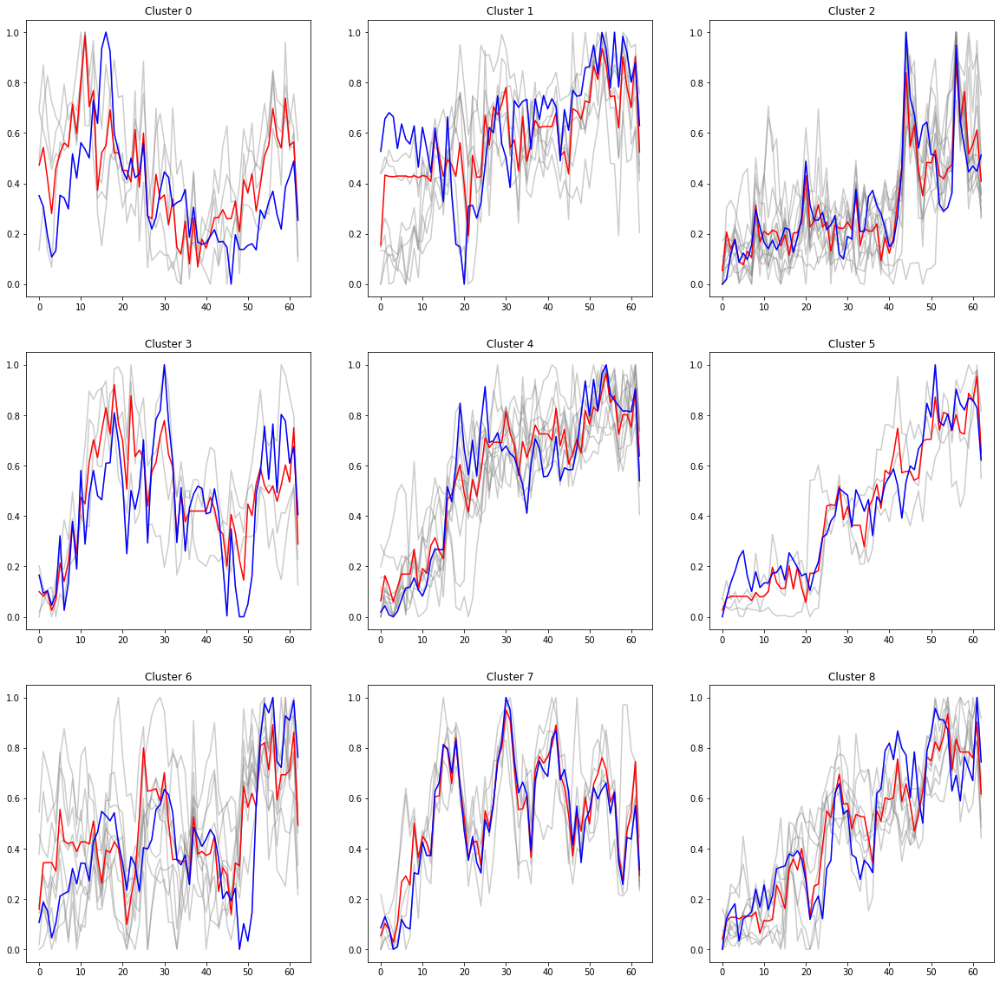

In [22]:
fig, axs = plt.subplots(plot_count, plot_count, figsize=(20, 20))
axs = axs.flatten()
for i, cluster in enumerate(clusters):
    pd.DataFrame(mySeries).T.iloc[:, cluster].plot(
        ax=axs[i], c="gray", alpha=0.4, legend=False)
    if len(cluster) > 0:
        axs[i].plot(dtw_barycenter_averaging(
            pd.DataFrame(mySeries).iloc[cluster]), c="red")
        pd.DataFrame(mySeries).T.iloc[:, [p for p in cluster if p in closest]].plot(
            ax=axs[i], c="blue", legend=False)

    axs[i].set_title("Cluster "+str(i))
plt.show()

 ## Analyse de données

 On a extrait les produits représentatifs des groupes et on a construit un nouveau jeu de données de séries temporelles sur lequel on va travailler par la suite.

In [23]:
sales_s = sales.iloc[:, sorted(closest)]
sales_s.head()

,P_2,P_21,P_22,P_30,P_37,P_38,P_47,P_55,P_64
2014-07-31,3603,16302,10467,19852,1865,3510,510,3849,1039
2014-08-31,3405,16907,11319,19164,2043,3804,524,3980,1134
2014-09-30,3434,16286,10956,17382,2188,3859,595,3787,1160
2014-10-31,3277,15147,9822,16034,2297,3823,636,3745,1180
2014-11-30,3396,15298,10427,16430,2432,3535,572,3861,1065


 ### Statistiques descriptives :
 Dans cette section, nous allons trouver quelques mesures de tendance et de dispersion comme la moyenne, médiane, la variance et l’écart type pour mieux percevoir les caractéristiques des médicaments.

,count,mean,std,min,25%,50%,75%,max
P_2,63.0,4341.3,671.6,3152.0,3848.0,4464.0,4810.0,5873.0
P_21,63.0,22139.8,3253.3,15147.0,19920.0,22859.0,24254.5,28709.0
P_22,63.0,13833.5,2646.6,9339.0,11800.0,13541.0,15096.5,19889.0
P_30,63.0,19873.6,3179.0,14339.0,17350.5,19426.0,21268.5,30048.0
P_37,63.0,2912.9,635.7,1865.0,2296.5,2873.0,3335.5,4273.0
P_38,63.0,3731.3,485.3,2310.0,3481.0,3797.0,4012.5,4586.0
P_47,63.0,735.2,147.9,510.0,633.5,698.0,828.0,1222.0
P_55,63.0,6718.7,1551.1,3745.0,5570.0,6991.0,7946.5,9120.0
P_64,63.0,1409.6,213.5,1039.0,1231.5,1334.0,1607.5,1817.0


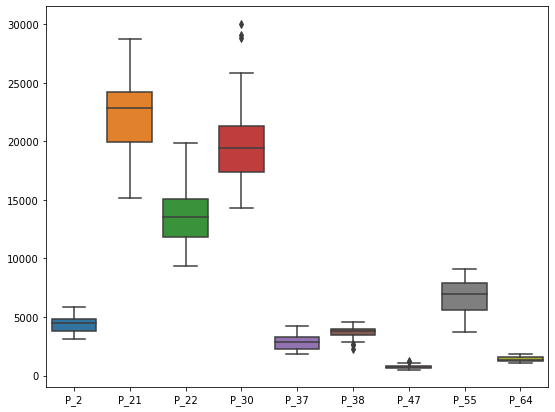

In [24]:
display(sales_s.describe().T.round(1))
plt.figure(figsize=(9, 7))
sns.boxplot(data=sales_s)
plt.show()

 D'après le tableau ci-dessus et le graphique, il est clair que ces médicaments ont des natures diverses et nous pouvons étendre cette remarque à tous les médicaments. Leurs moyennes et leur somme de ventes sont très différentes. Certains d'entre eux ont été vendus fortement comme le médicament 30, et d’autres sont moins vendus comme les médicaments 47 et 64. Certains médicaments ont une variance élevée comme les médicaments 30 et 22.
 Par conséquent, nous pouvons conclure que la majorité des médicaments ont des caractéristiques différentes en plus de la dissemblance dans le comportement de vente.

 ### Visualisation de la tendance et saisonnalité

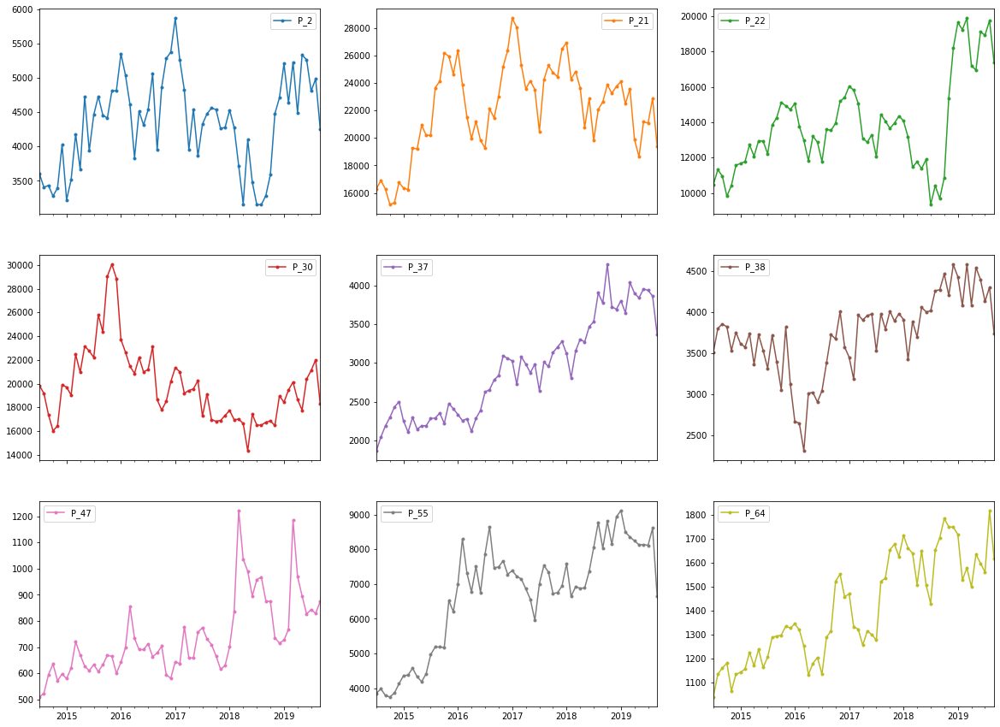

In [25]:
sales_s.plot(subplots=True, layout=(3, 3), figsize=(20, 15), marker='.')
plt.show()

 On peut observer une saisonnalité dans certains produits notamment P_64 et p_47, avec une variété de tendances, certaines gardent la même monotonie au cours du temps tel que celles des P_64 et d’autre produits possèdent une tendance qui alterne entre haussière et baissière.
 L’existence de hausses soudaine et significative dans le produit P_22 pourra biaiser la prévision

 Pour mieux visualiser la saisonnalité et tendance des ventes des médicaments, on a tracé pour chaque produit, une moyenne mobile 4-mois (pour détecter la saisonnalité) ainsi qu’une moyenne mobile 12-mois (pour capter la tendance)

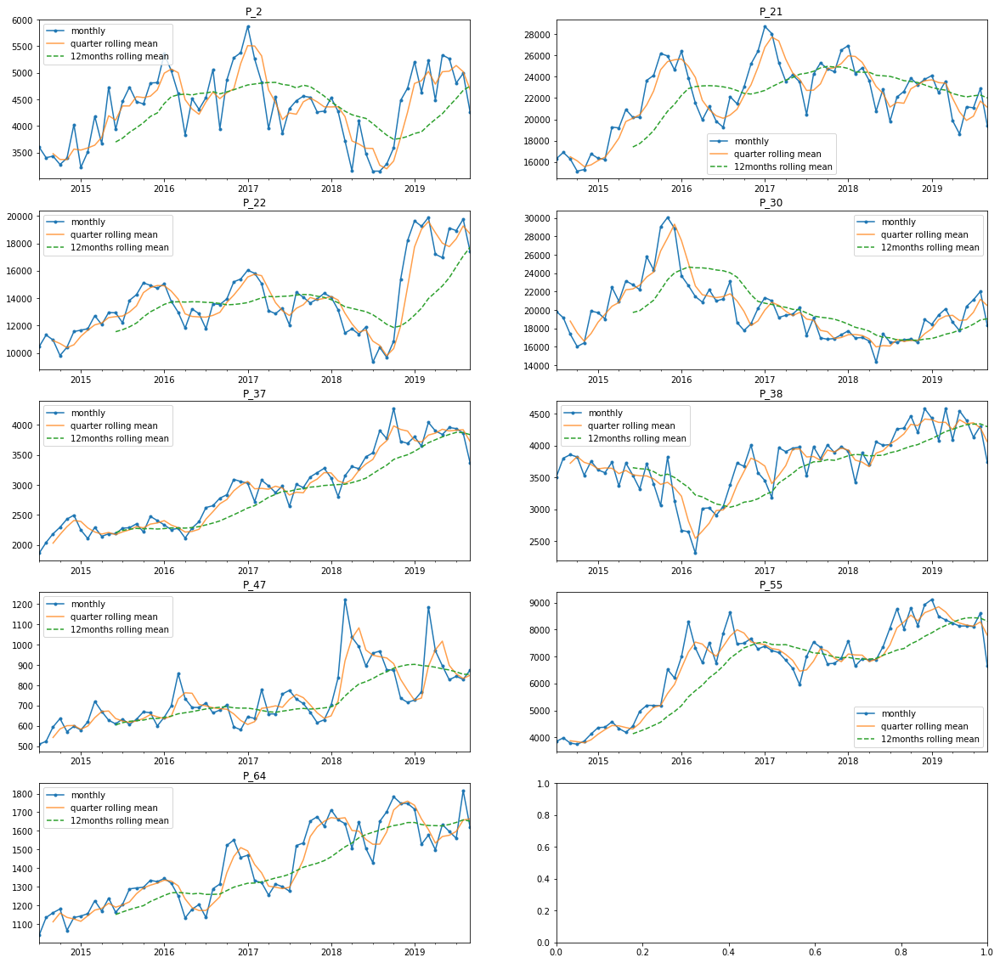

In [26]:
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
axs = axs.flatten()
cols = [next(color_cycle), next(color_cycle), next(color_cycle)]
for i, item in enumerate(sales_s.columns):
    sales_s[item].plot(title=item,
                       color=cols[0],
                       ax=axs[i],
                       marker='.', label="monthly")
    sales_s[item].rolling(3).mean().plot(
        color=cols[1],
        ax=axs[i], label="quarter rolling mean", alpha=0.75)
    sales_s[item].rolling(12).mean().plot(
        color=cols[2],
        ax=axs[i], linestyle='--', label="12months rolling mean")
    axs[i].legend()

Les graphiques ci-dessous représentent la décomposition des séries temporelles

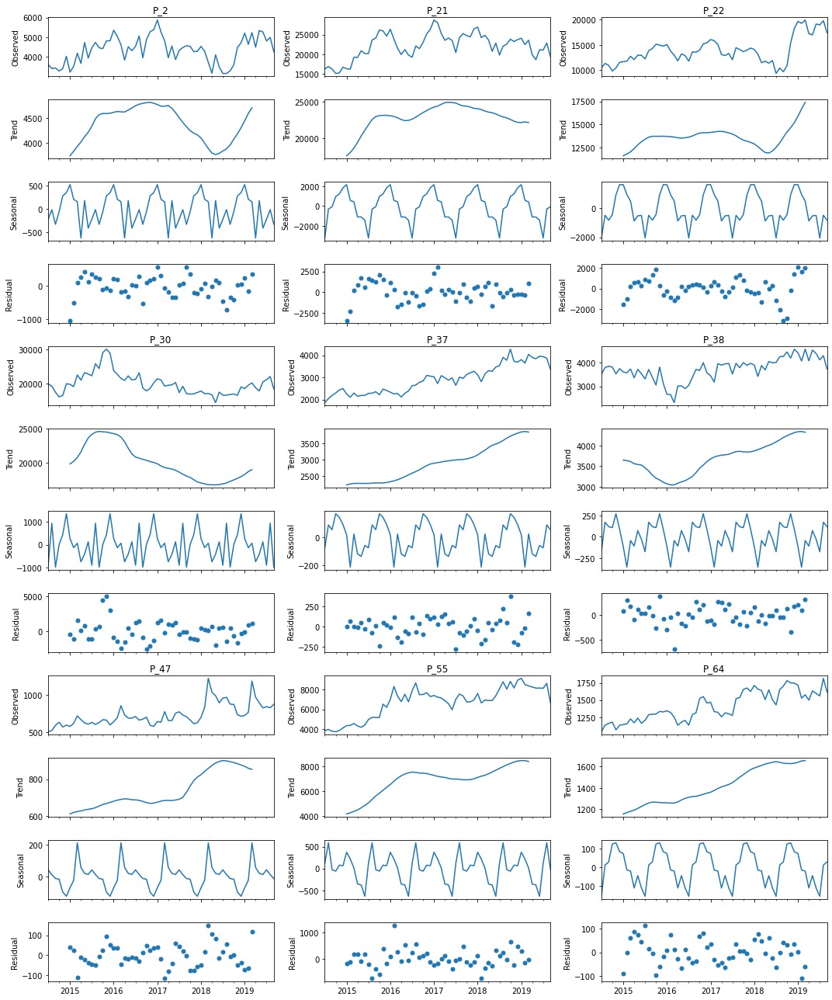

In [28]:
def plotseasonal(res, axes, name):
    res.observed.plot(ax=axes[0], legend=False, title=name)
    axes[0].set_ylabel('Observed')
    res.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')
    res.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')
    res.resid.plot(ax=axes[3], legend=False, marker='o',
                   linestyle='', markersize=5)
    axes[3].set_ylabel('Residual')
    plotseasonal.counter += 1

def grid_plotseasonal(df, ncol):
    nrow = ceil(len(df.columns)/ncol)*4
    fig, axes = plt.subplots(ncols=ncol, nrows=nrow,
                             sharex=True, figsize=(15, 1.5*nrow))
    plotseasonal.counter, k = 0, 0
    for i, col in enumerate(df.columns):
        res = seasonal_decompose(df[col].dropna(), period=12, filt=None)
        plotseasonal(res, axes[k:k+4, i % ncol], col)
        if (i % ncol) == (ncol-1):
            k += 4
    plt.tight_layout()
    plt.show()
    
grid_plotseasonal(sales_s, ncol=3)

 L'analyse des portions de chaque composant de la série chronologique est particulièrement utile pour déterminer l'absorption des résidus dans les données, sur la base des données décomposées. Le volume de cette absorption implique la prévisibilité de la série chronologique - plus les résidus sont élevés, moins la prévisibilité.

 Le tableau ci-dessous présente la moyenne des observations et la moyenne des résidus pour chaque produit, ainsi que la proportion de l’erreur par rapport à la série chronologique observée, pour l’ensemble des médicaments l’erreur ne dépasse pas 7% des ventes observées, chose qui indique qu’une quantité importante d’information pourra être expliquée.

In [29]:
d = pd.DataFrame(0, index=sales_s.columns, columns=[
                 "RESMEAN", "OBSMEAN", "PERC"], dtype=float)
for col in sales_s.columns:
    result = seasonal_decompose(sales_s[col], period=12, model='additive')
    res, obs = result.resid, result.observed
    d.loc[col][:2] = list(map(lambda x: np.mean(
        np.abs(x)), (res, obs[~np.isnan(res)])))
d.PERC = d.RESMEAN*100/d.OBSMEAN
d.round(2)

,RESMEAN,OBSMEAN,PERC
P_2,253.34,4376.67,5.79
P_21,912.88,23039.45,3.96
P_22,814.70,13678.31,5.96
P_30,1130.08,20098.61,5.62
P_37,94.88,2888.78,3.28
P_38,150.17,3677.69,4.08
P_47,46.05,738.08,6.24
P_55,261.75,6902.75,3.79
P_64,41.16,1418.96,2.90


In [30]:
sales_s.to_pickle("sales_s.pkl")

 # Modélisation statistique univarié : ARIMA
 ## Analyse de la stationnarité
 ### Analyse d’autocorrélation

In [33]:
def choose_d(l):
    return list(sorted(l))[1]

def Oui_non(x):
    return "Oui" if x else "Non"

def test_all(y):
    y = y.dropna()
    n_ch = nsdiffs(remove_trend(
        y)["serie"].dropna(), m=12, max_D=12, test='ch')
    n_ocsb = nsdiffs(remove_trend(
        y)["serie"].dropna(), m=12, max_D=12, test='ocsb')
    n_adf = ndiffs(y, test='adf')
    n_kpss = ndiffs(y, test='kpss')
    n_pp = ndiffs(y, test='pp')
    return (Oui_non(n_ch), Oui_non(n_ocsb), max(n_ch, n_ocsb), Oui_non(n_adf), 
            Oui_non(n_kpss), Oui_non(n_pp), choose_d((n_adf, n_kpss, n_pp)))

def multiple_test_all(df):
    res = pd.DataFrame(df.columns, columns=["Series"])
    res[1], res[2], res[3], res[4], res[5], res[6], res[7] = [
        [test_all(df[i])[j] for i in df.columns] for j in range(7)]
    res = res.set_index("Series")
    res.columns = ["Canova-Hansen", "OCSB", "Seasonality Order",
                   "ADF", "KPSS", "PP", "differencing order"]
    return res

def remove_trend(y):
    n_adf = ndiffs(y, test='adf')
    n_kpss = ndiffs(y, test='kpss')
    n_pp = ndiffs(y, test='pp')
    n_diff = choose_d((n_adf, n_kpss, n_pp))
    for i in range(n_diff):
        y = y.diff(1)
    return {"serie": y, "n_diff": n_diff}

def stationnarise(y):
    y, n_diff = remove_trend(y).values()
    y = y.dropna()
    n_ch = nsdiffs(y, m=12, max_D=12, test='ch')
    n_ocsb = nsdiffs(y, m=12, max_D=12, test='ocsb')
    n_sdiff = max(n_ch, n_ocsb)
    for i in range(n_sdiff):
        y = y.diff(12)
    return {"serie": y, "n_diff": n_diff, "n_sdiff": n_sdiff}

def series_from_summary(summary):
    return pd.DataFrame([dic['serie'] for dic in summary.values()]).T

def excess_short(forecast, actual):
    epsilon = forecast - actual
    mape = np.mean(np.abs(epsilon)/np.abs(actual))
    exces_mask = epsilon > 0
    short_mask = epsilon < 0
    mape_exces = np.sum(np.abs(
        forecast[exces_mask] - actual[exces_mask])/np.abs(actual[exces_mask]))/len(forecast)
    mape_short = np.sum(np.abs(
        forecast[short_mask] - actual[short_mask])/np.abs(actual[short_mask]))/len(forecast)
    return 100*mape_exces/mape, 100*mape_short/mape

def forecast_accuracy(forecast, actual):
    assert len(forecast) == len(actual)
    mape = mean_absolute_percentage_error(actual, forecast)*100
    mae = mean_absolute_error(actual, forecast)   # MAE
    rmse = mean_squared_error(actual, forecast, squared=True)  # RMSE
    mape_exces, mape_short = excess_short(forecast, actual)
    return pd.Series({'mape': mape, 'mae': mae, 'rmse': rmse, 'mape_exces': mape_exces, 'mape_short': mape_short})

 \
 L'analyse d'autocorrélation illustre le potentiel de prédiction des données de séries chronologiques. Les graphiques d'autocorrélation résument graphiquement la force d'une relation avec une observation dans une série chronologique avec des observations à des pas de temps antérieurs. Le coefficient de Pearson est utilisé pour mesurer l'autocorrélation. Ainsi, l'analyse suivante n'est pertinente que pour les données avec une distribution gaussienne normale.

 Un tracé de l'autocorrélation d'une série chronologique par décalage est appelé la fonction d'autocorrélation (ACF). Ce graphique est parfois appelé corrélogramme ou graphique d'autocorrélation. Le graphique montre la valeur de décalage le long de l'axe des x et la corrélation sur l'axe des y entre -1 et 1. Les intervalles de confiance sont dessinés sous forme de cône. Par défaut, il est défini sur un intervalle de confiance de 95%, ce qui suggère que les valeurs de corrélation en dehors de ce code sont très probablement une corrélation.

 La figure ci-dessous présente la fonction d’autocorrélation (ACF) pour chacun des médicaments avec un intervalle de confiance de 95%.

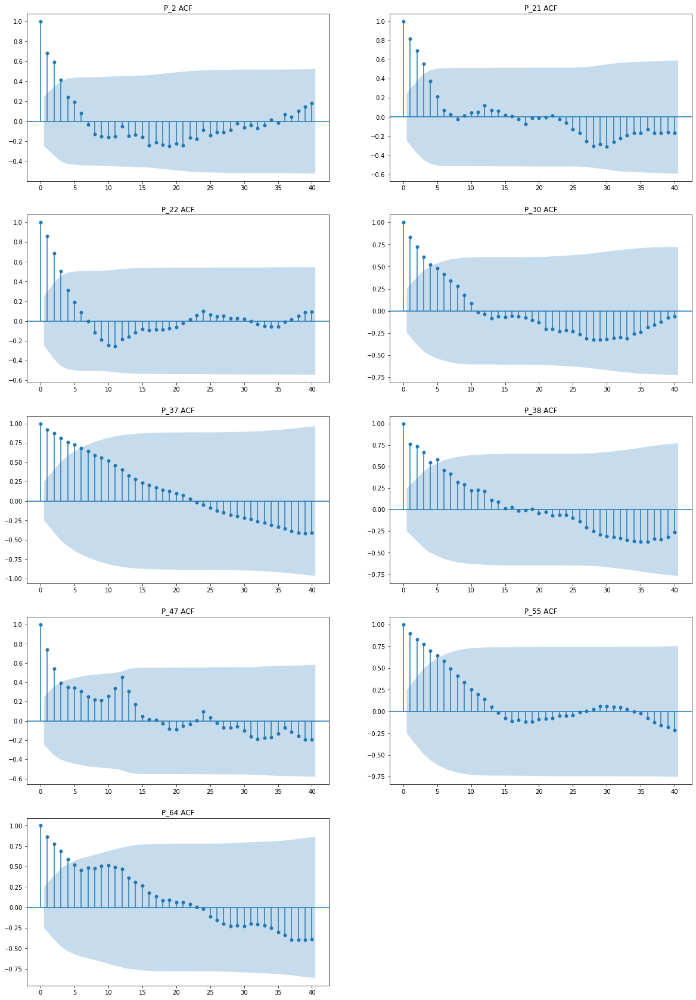

In [37]:
fig, axes = plt.subplots(5, 2, figsize=(20, 30), sharex=False)
axes[-1, -1].axis('off')
axs = axes.flatten()
alpha = .05
for i, col in enumerate(sales_s.columns):
    sm.graphics.tsa.plot_acf(sales_s[col].values.squeeze(
    ), lags=40, ax=axs[i], title=f"{col} ACF", alpha=alpha)

 D'après les correlogrames des séries temporelles ci dessus, on peut constater que la fonction d'autocorrelation se dégrade ou diminue lentement, ce qui indique la non stationnarité des séries.
 De plus, dans les deux séries des produits p_47 et p_64 l'ACF montre une oscillation et des pics qui se reproduisent avec des décalages de 12 mois indicant un effet de saisonnalité.

 ### Tests de stationnarité
 Afin d'estimer le terme de différenciation saisonnière D, on a effectué deux tests de saisonnalité pour différents niveaux de D pour estimer le nombre de différences saisonnières nécessaires pour rendre la série chronologique stationnaire et on a sélectionné la valeur maximale de D pour laquelle la série chronologique est jugée saisonnièrement stationnaire par le test statistique.

 De même, pour estimer le terme de différenciation d, on a effectué trois test statistiques de racine unitaire : Augmented Dickey Fuller (ADF), Phillips–Perron (PP) et Kwiatkowski–Phillips–Schmidt–Shin (KPSS) pour différents niveaux de d afin d'estimer le nombre de différences nécessaires pour rendre chaque série chronologique stationnaire, et on a sélectionné la valeur maximale de d pour laquelle la série temporelle est jugée stationnaire par le test statistique.

 Le tableau ci dessous synthétise les résultats, chaque test de saisonnalité indique la présence ou absence d'un effet de saisonnalié, et de même pour les tests de racine unitaire, ainsi que les ordres de differenciation nécaissaires pour stationnarier la série.

In [38]:
multiple_test_all(sales_s)

,Canova-Hansen,OCSB,Seasonality Order,ADF,KPSS,PP,differencing order
Series,,,,,,,
P_2,Non,Non,0,Oui,Non,Non,0
P_21,Non,Non,0,Oui,Oui,Oui,1
P_22,Non,Non,0,Oui,Oui,Oui,1
P_30,Non,Non,0,Oui,Oui,Oui,1
P_37,Non,Non,0,Oui,Oui,Non,1
P_38,Non,Non,0,Oui,Oui,Non,1
P_47,Non,Oui,1,Non,Oui,Non,0
P_55,Non,Non,0,Oui,Oui,Oui,1
P_64,Non,Oui,1,Non,Oui,Non,0


 ### Stationnarisation des séries
 On a procedé par la suite à la stationnarisation des séries en appliquant la differenciation adéquate, et on a reéffectué les mêmes tests pour confirmer qu'on a atteint la stationnarité des séries.

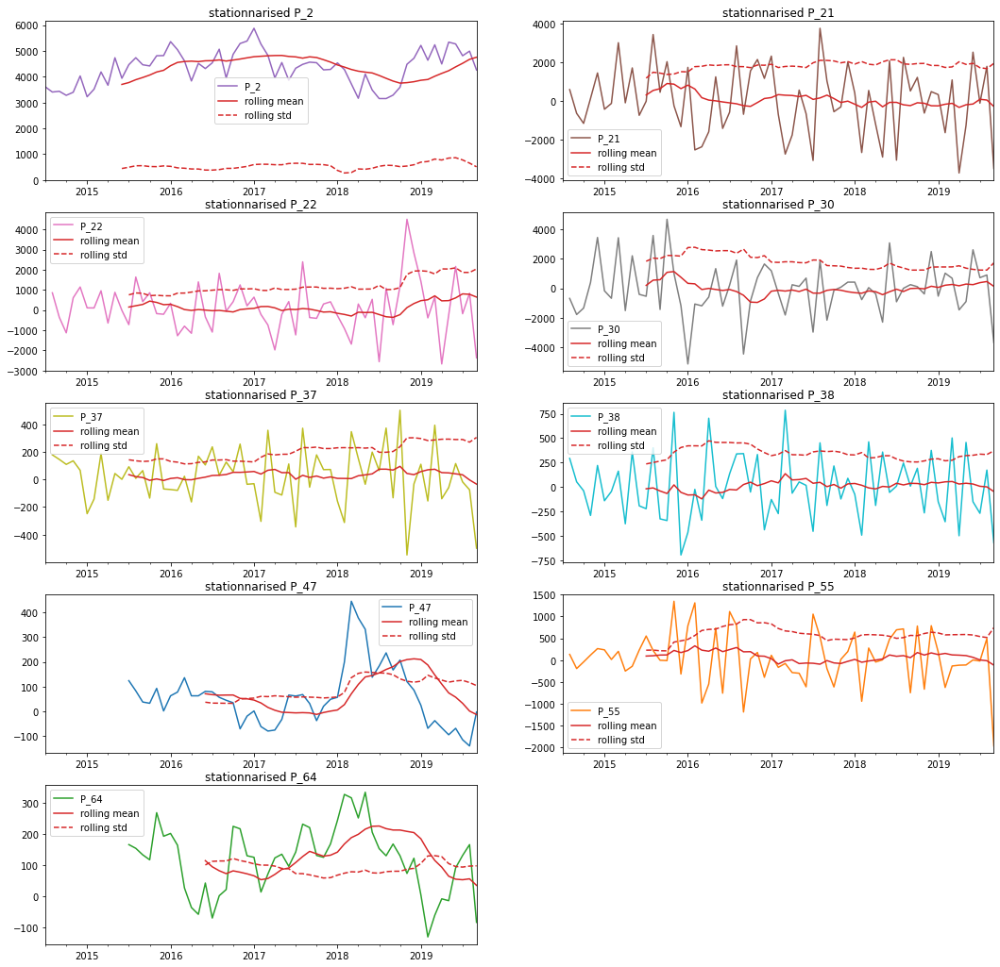

In [40]:
stationnarisation_summary = {key: 0 for key in sales_s.columns}
for col in sales_s.columns:
    stationnarisation_summary[col] = stationnarise(sales_s[col])
stationnaries = series_from_summary(stationnarisation_summary)

fig, axs = plt.subplots(5, 2, figsize=(18, 18))
remove_axes(len(sales_s.columns), axs)
axs = axs.flatten()
cols = [next(color_cycle)]*3
for i, item in enumerate(sales_s.columns):
    stationnaries[item].plot(title=f"stationnarised {item}",
                             color=next(color_cycle),
                             ax=axs[i])
    stationnaries[item].rolling(12).mean().plot(
        color=cols[1],
        ax=axs[i], label="rolling mean")
    stationnaries[item].rolling(12).std().plot(
        color=cols[2],
        ax=axs[i], linestyle='--', label="rolling std")
    axs[i].legend()

In [41]:
multiple_test_all(stationnaries)

,Canova-Hansen,OCSB,Seasonality Order,ADF,KPSS,PP,differencing order
Series,,,,,,,
P_2,Non,Non,0,Oui,Non,Non,0
P_21,Non,Non,0,Non,Non,Non,0
P_22,Non,Non,0,Non,Non,Non,0
P_30,Non,Non,0,Non,Non,Non,0
P_37,Non,Non,0,Non,Non,Non,0
P_38,Non,Non,0,Non,Non,Non,0
P_47,Non,Non,0,Oui,Non,Oui,1
P_55,Non,Non,0,Non,Non,Non,0
P_64,Non,Non,0,Oui,Non,Oui,1


 Les tests finals confirment qu’on a bien atteint la stationnarité des séries.

 ## Prévisions par ARIMA
 ### selection des meilleurs modèles 
 Les graphiques ci-dessous représentent pour chaque produit la fonction d’autocorrelation (ACF) ainsi que la fonction d’autocorrélation partielle (PACF) de la série stationnarisée.

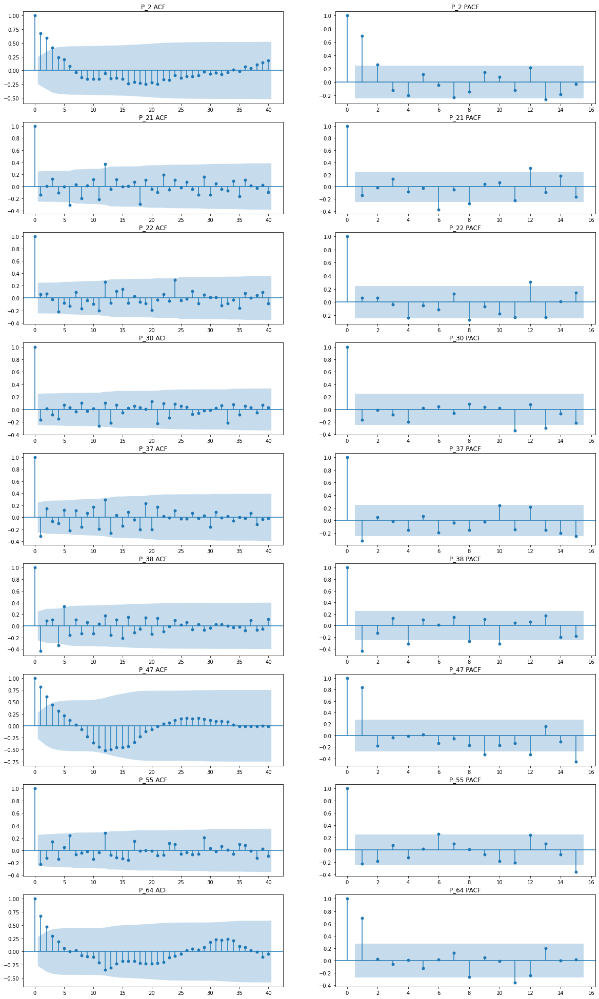

In [42]:
fig, axes = plt.subplots(9, 2, figsize=(20, 35), sharex=False)
alpha = .05
for i, col in enumerate(sales_s.columns):
    sm.graphics.tsa.plot_acf(stationnaries[col].dropna().values.squeeze(
    ), lags=40,                              ax=axes[i, 0], title=f"{col} ACF", alpha=alpha)
    sm.graphics.tsa.plot_pacf(stationnaries[col].dropna().values.squeeze(
    ), lags=15,                               ax=axes[i, 1], title=f"{col} PACF", alpha=alpha)

 A l’addition de la stationnarité des séries qui peut être confirmé à partir de ces corrélogrammes, ces derniers nous permettent aussi de déterminer l'ordre d'ARIMA, mais la détection visuelle ne permet pas toujours d'atteindre la performance maximale, c'est pourquoi on a utilisé la fonction Auto_Arima qui permet d'ajuste le meilleur modèle ARIMA à une série temporelle univariée selon un critère d'information fourni (soit AIC, AICc, BIC...). La fonction effectue une recherche (soit pas à pas, soit parallélisée) sur des ordres de modèle et saisonniers possibles dans les contraintes fournies, et sélectionne les paramètres qui minimisent la métrique donnée.#
 L'approche parallèle est une méthode de brute force naïve, il s'agit d'une recherche de grille (grid search) sur diverses combinaisons d'hyperparamètres. Cela prendra généralement plus de temps pour plusieurs raisons. Tout d'abord, il n'y a pas de procédure intelligente sur la façon dont les commandes de modèles sont testées ; ils sont tous testés (pas de court-circuit), ce qui peut prendre un certain temps.

 L'approche par étapes (stepwise) suit la stratégie définie par Hyndman et Khandakar dans leur article de 2008, « Automatic Time Series Forecasting : The Forecast Package for R ».

 Étape 1 : Essayez quatre modèles possibles pour commencer :

 ARIMA(2,d,2) si m = 1 et ARIMA(2,d,2)(1,D,1) si m > 1\
 ARIMA(0,d,0) si m = 1 et ARIMA(0,d,0)(0,D,0) si m > 1\
 ARIMA(1,d,0) si m = 1 et ARIMA(1,d,0)(1,D,0) si m > 1\
 ARIMA(0,d,1) si m = 1 et ARIMA(0,d,1)(0,D,1) si m > 1\
 Le modèle avec le plus petit AIC (ou BIC, ou AICc, etc., selon les critères de minimisation) est sélectionné. C'est le "meilleur" modèle actuel.

 Étape 2 : Considérez un certain nombre d'autres modèles :

 Où l'un des p, q, P et Q peut varier de ±1 par rapport au meilleur modèle actuel\
 Où p et q varient tous les deux de ±1 par rapport au meilleur modèle actuel\
 Où P et Q varient tous les deux de ±1 par rapport au meilleur modèle actuel\
 Chaque fois qu'un modèle avec un critère d'information inférieur est trouvé, il devient le nouveau meilleur modèle actuel, et la procédure est répétée jusqu'à ce qu'il ne puisse pas trouver un modèle proche du meilleur modèle actuel avec un critère d'information inférieur ou que le processus dépasse l'un des seuils d'exécution défini via arima.StepwiseContext.


In [44]:
@meta_decorator("joblib_ARIMA_sales_s_Models.joblib")
def auto_arima_for_df(df, trace: bool):
    """find best arima model for each series in a data frame, returns dict of models"""
    models = {}
    for col in df.columns:
        if trace:
            print('\n', col, ':')
        models[col] = auto_arima(df[col], start_p=1, start_q=1,
                                    test='adf',       # use adftest to find optimal 'd'
                                    max_p=3, max_q=3,  # maximum p and q
                                    m=12,              # frequency of series
                                    #                       d=None,           # let model determine 'd'
                                    #                       seasonal=True,   # No Seasonality
                                    #                       start_P=0,
                                    #                       D=0,
                                    trace=trace,
                                    #                       error_action='ignore',
                                    #                       suppress_warnings=True,
                                    stepwise=True)
    return models
models = auto_arima_for_df(sales_s, trace=False)

models imported


 Les meilleurs modèles sélectionnés sont :

In [45]:
res = pd.DataFrame(columns=['Best model', 'AIC', 'BIC'])
for col in sales_s.columns:
    tbl = models[col].summary().tables[0].data
    res = res.append({"Best model": tbl[1][1],                       "AIC": float(
        tbl[2][3]),                      "BIC": float(tbl[3][3])}, ignore_index=True)
res.set_index(sales_s.columns)

,Best model,AIC,BIC
P_2,"SARIMAX(1, 1, 0)x(1, 0, 0, 12)",940.112,946.494
P_21,"SARIMAX(0, 1, 0)x(1, 0, 0, 12)",1103.421,1107.675
P_22,"SARIMAX(0, 1, 0)",1063.119,1065.246
P_30,"SARIMAX(0, 1, 0)",1109.946,1112.074
P_37,"SARIMAX(1, 1, 0)x(1, 0, 0, 12)",829.734,836.116
P_38,"SARIMAX(2, 1, 1)x(2, 0, [], 12)",881.211,893.974
P_47,"SARIMAX(0, 1, 0)x(1, 1, 0, 12)",566.959,570.783
P_55,"SARIMAX(0, 1, 1)x(1, 0, [], 12)",964.691,971.072
P_64,"SARIMAX(0, 1, 0)x(0, 1, [1], 12)",581.183,585.007


### Prévisions statiques et dynamiques


 On a effectué la prévision de l'ensemble des séries par les meilleurs modèles ARIMA séléctionnés selon deux approches.

 La méthode de prévision statique calcule une séquence de prévisions à un pas d'avance, en utilisant les valeurs réelles plutôt que prévues pour les variables dépendantes décalées, si elles sont disponibles. En effet, pour effectuer la prévision d'un nouveau mois, le modèle est mis a jour en incluant la valeur réelle du mois précédant, cette méthode est plus performante et donne des prévisions moins biaisées mais ne peut etre utilisée que pour prévoir un seul mois à l'avance.

 La méthode de prévision dynamique calcule des prévisions dynamiques en plusieurs étapes à partir de la première période de l'échantillon de prévision, les valeurs précedemment prévues pour les variables dépendantes décalées sont utilisées pour former la prévision de la valeur actuelle. Cette méthode est utile lorsque l'entreprise s'interesse à effectuer une prévision à long terme, c'est dire prévoir les ventes de plusieurs mois à l'avance.


In [46]:
train_arima = sales_s.loc[:'2018-12-31']
test_arima = sales_s.loc['2019-01-31':]

In [49]:
def empty_df_like(df):
    return pd.DataFrame(columns=df.columns, index=df.index)

def empty_df_to_date(df, n_periods):
    return pd.DataFrame(columns=df.columns, 
                        index=pd.date_range(df.index[-1], freq="M", periods=n_periods).shift(1, freq='M'))

def arima_dynamic_out_of_sample_forecast(models, train_df, n_periods):
    """enerate future dynamic forecast to the given periods"""
    # fitted_dynamic = [0]*len(train_df.columns)
    fc_df = empty_df_to_date(train_df, n_periods)
    lower_df = empty_df_to_date(train_df, n_periods)
    upper_df = empty_df_to_date(train_df, n_periods)

    for col in train_df.columns:
        fitted_dynamic = models[col].fit(train_df[col])
        fc, confint = fitted_dynamic.predict(
            n_periods=n_periods, return_conf_int=True)

        fc_df[col] = fc
        lower_df[col] = confint[:, 0]
        upper_df[col] = confint[:, 1]
    return {'fc_df': fc_df, 'lower_df': lower_df, 'upper_df': upper_df}

def arima_dynamic_in_sample_forecast(models, train_df, test_df):
    """generate dynamic forecast with confidence intervales and accuracy"""
    n_series = len(train_df.columns)
    n_periods = len(test_df)
    # fitted_dynamic = [0]*n_series
    accuracies_dynamic = pd.DataFrame(columns=test_df.columns, index=[
                                      'mape', 'mae', 'rmse', 'mape_exces', 'mape_short'])

    fc_df = empty_df_like(test_df)
    lower_df = empty_df_like(test_df)
    upper_df = empty_df_like(test_df)

    for col in train_df.columns:
        fitted_dynamic = models[col].fit(train_df[col])
        fc, confint = fitted_dynamic.predict(
            n_periods=n_periods, return_conf_int=True)

        fc_df[col] = fc
        lower_df[col] = confint[:, 0]
        upper_df[col] = confint[:, 1]
        accuracies_dynamic[col] = forecast_accuracy(fc_df[col], test_df[col])
    return {'fc_df': fc_df, 'lower_df': lower_df, 'upper_df': upper_df, 'accuracies_dynamic': accuracies_dynamic}

In [50]:
def plot_forecast_ARIMA(forecast_data, df, plot_anomalies=False):
    n_series = len(df.columns)
    fig_n_lines = ceil(n_series/2)
    # fig, axs = plt.subplots(fig_n_lines, 2 if n_series>1 else 1, figsize=(20, fig_n_lines*4))
    if n_series > 1:
        fig, axs = plt.subplots(fig_n_lines, 2, figsize=(20, fig_n_lines*4))
        remove_axes(n_series, axs)
        axs = axs.flatten()
    else:
        fig, axs = plt.subplots(fig_n_lines, 1, figsize=(15, 7))
        axs = [axs]

    for i, item in enumerate(df.columns):
        axs[i].plot(df[item], label="actual")
        # axs[i].plot(pd.concat([df[item], forecast_data['fc_df'][item]]), label="actual")
        axs[i].plot(forecast_data['fc_df'][item],
                    color='darkgreen', label="forecast")
        axs[i].set_title(f"{item} forecast")

        lower = forecast_data['lower_df'][item]
        upper = forecast_data['upper_df'][item]
        axs[i].plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        axs[i].plot(upper, "r--", alpha=0.5)

        axs[i].axvspan(lower.index[0], lower.index[-1],
                       color=sns.xkcd_rgb['grey'], alpha=0.2)

        if plot_anomalies:
            index_of_pred = forecast_data['fc_df'].index
            y_test = df[item][index_of_pred]
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test < lower] = y_test[y_test < lower]
            anomalies[y_test > upper] = y_test[y_test > upper]
            anomalies_series = pd.Series(anomalies, index=index_of_pred)
            if ~np.isnan(anomalies).all():
                axs[i].plot(anomalies_series, "o",
                            markersize=10, label="Anomalies")
        axs[i].legend(loc="best")

 Les graphiques ci-dessous représentent les prévisions effectuées par les deux méthodes ainsi que les intervalles de confiance (95%).
 On peut constater que les séries des deux produits P_22 et P_30 correspondent à des marches aléatoires, la meilleure prévision dans ce cas est la valeur précendente.
 Les intervalles de prévision associés à la méthode dynamique s'allongent à mesure que l'horizon de prévision s'allonge, plus nous prévoyons à l'avance, plus l'incertitude est associée à la prévision, et donc plus les intervalles de prévision sont larges.
 Dans les prévisions par la méthode statique, la variation de la distribution des prévisions est presque la même que la variation des résidus.

In [51]:
arima_dynamic_in_sample_forecast_res = arima_dynamic_in_sample_forecast(
    models, train_arima, test_arima)
# arima_dynamic_in_sample_forecast_res
pretty_df(arima_dynamic_in_sample_forecast_res['accuracies_dynamic'])

Series,P_2,P_21,P_22,P_30,P_37,P_38,P_47,P_55,P_64
mape,10.108584,8.755862,6.166482,5.999308,5.759123,5.542042,8.716832,9.811062,6.667103
mae,515.290025,1742.884145,1156.888889,1214.777778,215.024574,222.121861,73.988869,746.358974,105.540172
rmse,370722.165335,5250826.349604,1440781.555556,2184788.111111,65971.833832,101129.038650,7228.032853,974406.058422,14501.115178
mape_exces,0.671463,97.833190,32.220680,27.370023,36.400725,96.274897,90.898348,97.929182,96.897703
mape_short,99.328537,2.166810,67.779320,72.629977,63.599275,3.725103,9.101652,2.070818,3.102297


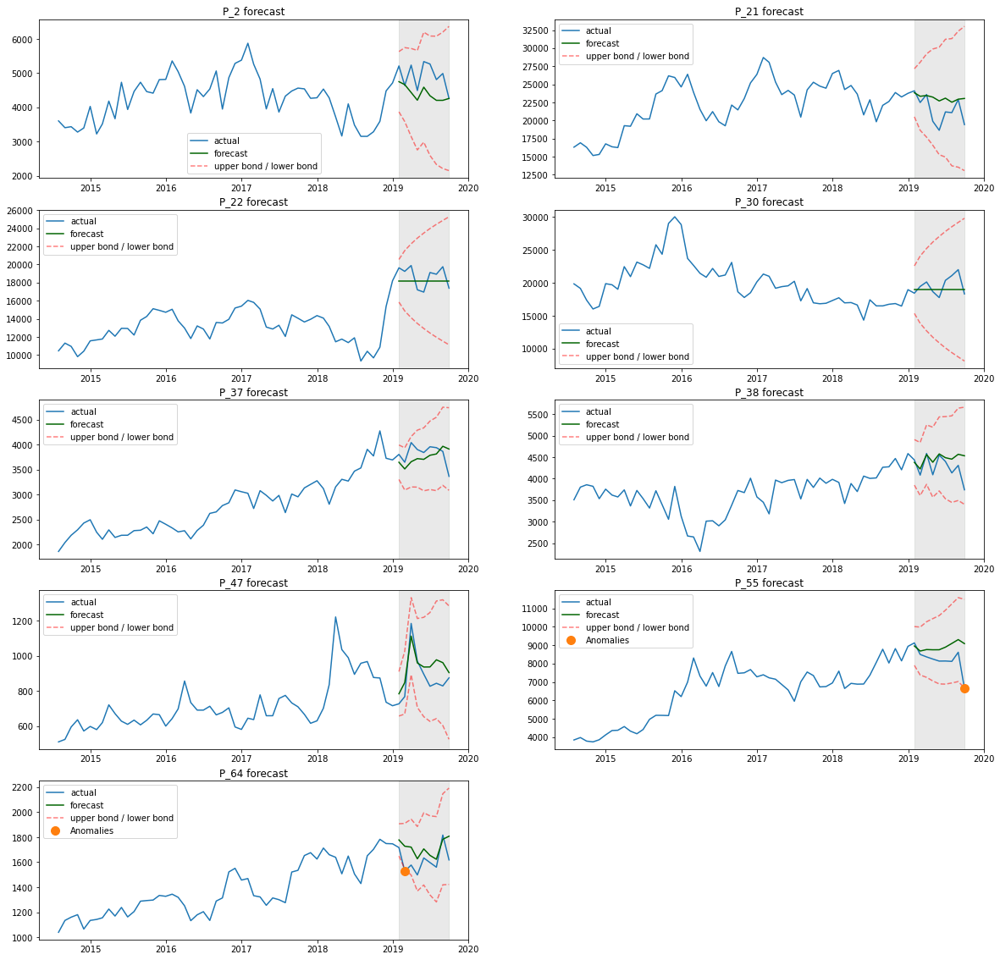

In [52]:
plot_forecast_ARIMA(arima_dynamic_in_sample_forecast_res, sales_s, True)

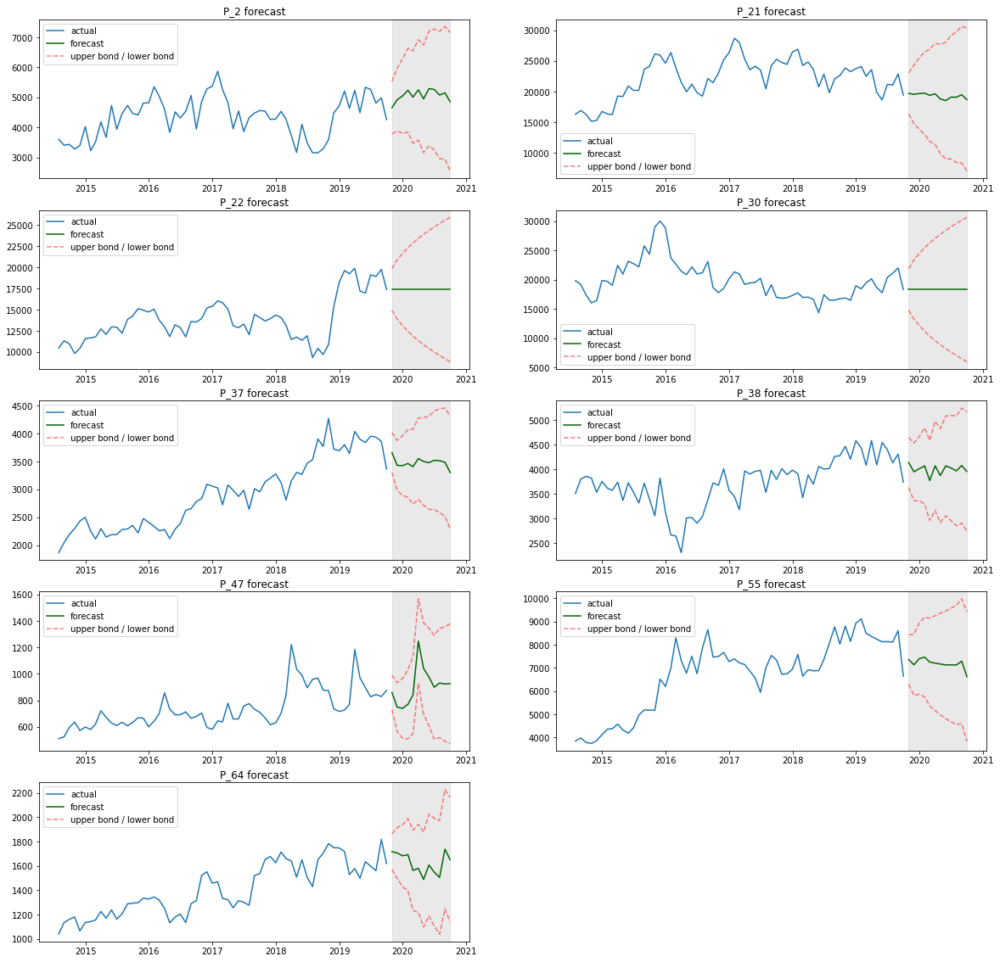

In [54]:
arima_dynamic_out_of_sample_forecast_res = arima_dynamic_out_of_sample_forecast(
    models, sales_s, 12)
# arima_dynamic_out_of_sample_forecast_res
plot_forecast_ARIMA(arima_dynamic_out_of_sample_forecast_res, sales_s)

In [56]:
def arima_static_in_sample_forecast(models, train_df, test_df):
    """generate dynamic forecast with confidence intervales and accuracy"""
    n_series = len(train_df.columns)
    n_periods = len(test_df)
    # fitted_static = [0]*n_series
    accuracies_static = pd.DataFrame(columns=test_df.columns, index=[
                                     'mape', 'mae', 'rmse', 'mape_exces', 'mape_short'])

    fc_df = empty_df_like(test_df)
    lower_df = empty_df_like(test_df)
    upper_df = empty_df_like(test_df)

    for col in train_df.columns:
        fitted_static = models[col].fit(train_df[col])
        preds = np.zeros((len(test_df)))
        conf_int = np.zeros((len(test_df), 2))

        for j in range(len(test_df)):
            new_preds, new_conf_int = fitted_static.predict(
                n_periods=1, return_conf_int=True)
            fitted_static.update([test_df[col].iloc[j]])
            preds[j] = new_preds
            conf_int[j] = new_conf_int

        fc_df[col] = preds
        lower_df[col] = conf_int[:, 0]
        upper_df[col] = conf_int[:, 1]
        accuracies_static[col] = forecast_accuracy(fc_df[col], test_df[col])
    return {'fc_df': fc_df, 'lower_df': lower_df, 'upper_df': upper_df, 'accuracies_static': accuracies_static}

arima_static_in_sample_forecast_res = arima_static_in_sample_forecast(
    models, train_arima, test_arima)
errors_ARIMA = arima_static_in_sample_forecast_res['accuracies_static']
pretty_df(errors_ARIMA)

Series,P_2,P_21,P_22,P_30,P_37,P_38,P_47,P_55,P_64
mape,7.988069,7.568128,6.642814,7.220782,4.425410,4.214090,6.252274,5.196195,4.623019
mae,387.221975,1564.656418,1217.111111,1393.555556,163.513238,173.036548,57.878158,386.609802,75.191947
rmse,189287.398949,3784128.329439,2322438.000000,2951031.555556,48702.964300,43181.137813,5392.836057,363277.664755,10311.821486
mape_exces,50.373516,65.167297,56.453425,55.367526,71.799478,81.532549,52.711708,90.776528,65.664289
mape_short,49.626484,34.832703,43.546575,44.632474,28.200522,18.467451,47.288292,9.223472,34.335711


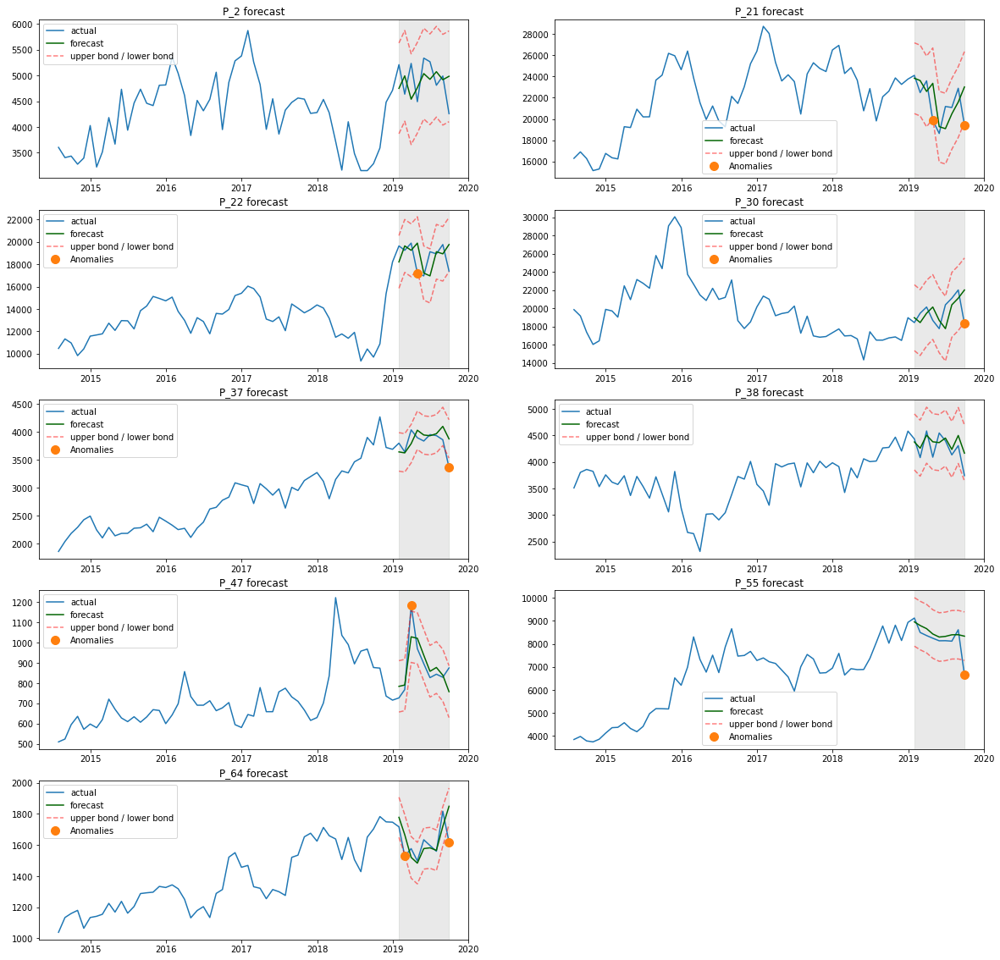

In [57]:
plot_forecast_ARIMA(arima_static_in_sample_forecast_res, sales_s, True)

In [58]:
def Verif(x):
    return "Vérifié" if x else "Non Vérifié"

 ### Diagnostic des résidus

 Pour la validation des modèles obtenus, on a effectué un diagnostic des résidus.
 le tableau ci-dessous synthétise les résultats des tests de bruit blanc, homoscedasticité et normalité pour le résidus de chacune des séries

In [59]:
res = pd.DataFrame(columns=['Prob(Q)', 'White noise',
                   'Prob(H)', 'Homoscedasticity', 'Prob(JB)', 'Normality'])
for col in sales_s.columns:
    tbl = models[col].summary().tables[2].data
    res = res.append({"Prob(Q)": float(tbl[1][1]), "White noise": Verif(float(tbl[1][1]) > 0.05), 
                      "Prob(H)": float(tbl[3][1]), "Homoscedasticity": Verif(float(tbl[3][1]) > 0.05), 
                      "Prob(JB)": float(tbl[1][3]), "Normality": Verif(float(tbl[1][3]) > 0.05)}, ignore_index=True)
res.set_index(sales_s.columns)

,Prob(Q),White noise,Prob(H),Homoscedasticity,Prob(JB),Normality
P_2,0.92,Vérifié,0.94,Vérifié,0.71,Vérifié
P_21,0.27,Vérifié,0.98,Vérifié,0.46,Vérifié
P_22,0.60,Vérifié,0.00,Non Vérifié,0.01,Non Vérifié
P_30,0.18,Vérifié,0.09,Vérifié,0.50,Vérifié
P_37,1.00,Vérifié,0.00,Non Vérifié,0.06,Vérifié
P_38,0.74,Vérifié,0.02,Non Vérifié,0.49,Vérifié
P_47,0.89,Vérifié,0.10,Vérifié,0.00,Non Vérifié
P_55,0.68,Vérifié,0.71,Vérifié,0.40,Vérifié
P_64,0.27,Vérifié,0.69,Vérifié,0.28,Vérifié


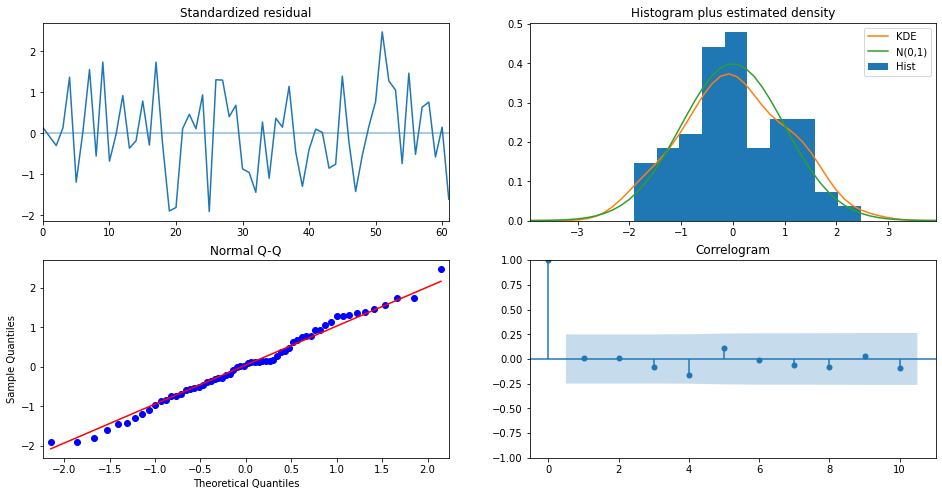

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   63
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 12)   Log Likelihood                -467.059
Date:                            Sun, 01 Aug 2021   AIC                            940.119
Time:                                    19:19:41   BIC                            946.500
Sample:                                         0   HQIC                           942.624
                                             - 63                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3477      0.122     -2.844      0.004      -0.587      -0.108
ar.S.L12       0.4052      0.129      3.131      0.002       0.152       0.659
sigma2      2.021e+05   4.38e+04      4.618      0.000    1.16e+05    2.88e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 0.67
Prob(Q):                              0.92   Prob(JB):                         0.71
Heteroskedasticity (H):               1.03   Skew:                             0.06
Prob(H) (two-sided):                  0.94   Kurtosis:                         2.51
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

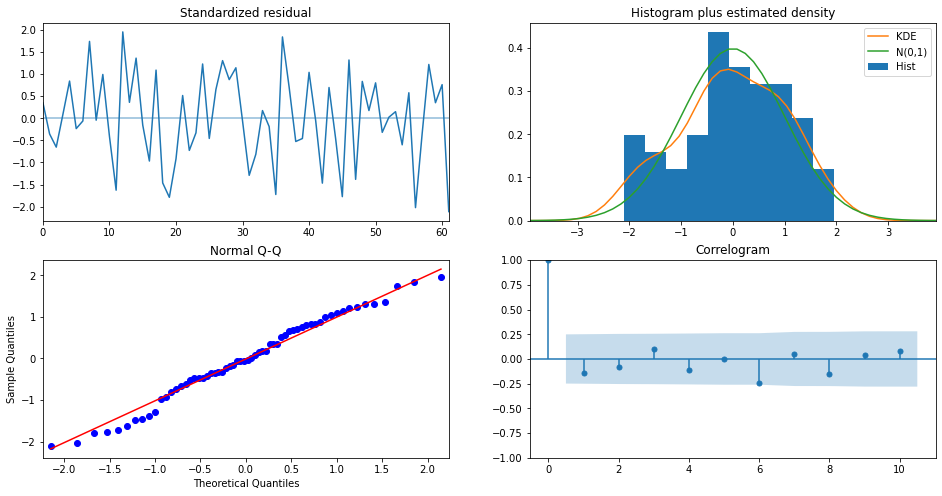

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   63
Model:             SARIMAX(0, 1, 0)x(1, 0, 0, 12)   Log Likelihood                -549.694
Date:                            Sun, 01 Aug 2021   AIC                           1103.389
Time:                                    19:19:45   BIC                           1107.643
Sample:                                         0   HQIC                          1105.059
                                             - 63                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       0.2272      0.071      3.193      0.001       0.088       0.367
sigma2       2.88e+06   6.35e+05      4.534      0.000    1.64e+06    4.13e+06
===================================================================================
Ljung-Box (L1) (Q):                   1.22   Jarque-Bera (JB):                 1.56
Prob(Q):                              0.27   Prob(JB):                         0.46
Heteroskedasticity (H):               1.01   Skew:                            -0.20
Prob(H) (two-sided):                  0.98   Kurtosis:                         2.33
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

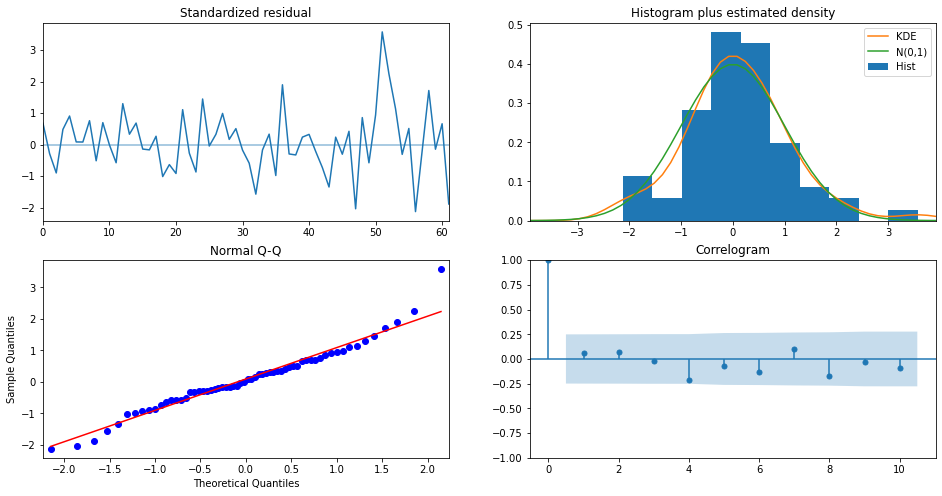

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   63
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -530.559
Date:                Sun, 01 Aug 2021   AIC                           1063.119
Time:                        19:19:47   BIC                           1065.246
Sample:                             0   HQIC                          1063.954
                                 - 63                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.585e+06    2.1e+05      7.558      0.000    1.17e+06       2e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.28   Jarque-Bera (JB):                 8.43
Prob(Q):                              0.60   Prob(JB):                         0.01
Heteroskedasticity (H):               4.56   Skew:                             0.48
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.54
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

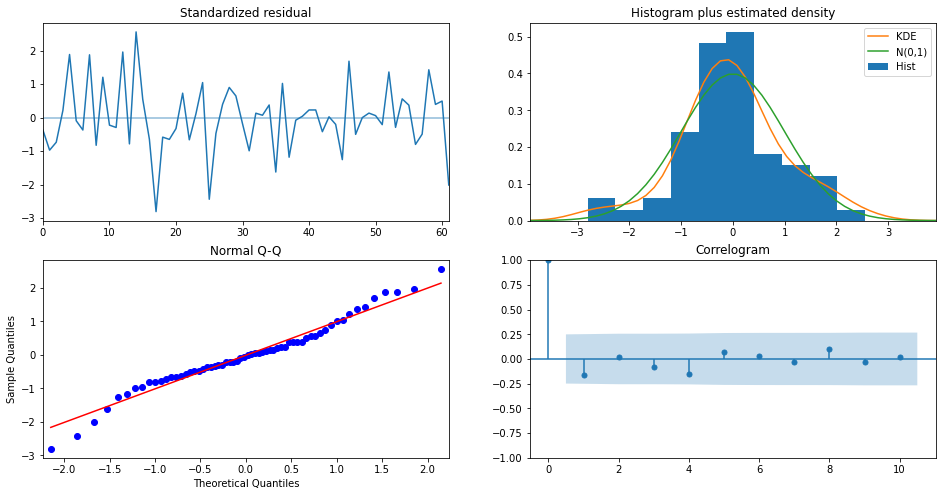

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   63
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -553.969
Date:                Sun, 01 Aug 2021   AIC                           1109.939
Time:                        19:19:50   BIC                           1112.066
Sample:                             0   HQIC                          1110.774
                                 - 63                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.366e+06   5.16e+05      6.519      0.000    2.35e+06    4.38e+06
===================================================================================
Ljung-Box (L1) (Q):                   1.76   Jarque-Bera (JB):                 1.37
Prob(Q):                              0.18   Prob(JB):                         0.50
Heteroskedasticity (H):               0.47   Skew:                            -0.03
Prob(H) (two-sided):                  0.09   Kurtosis:                         3.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

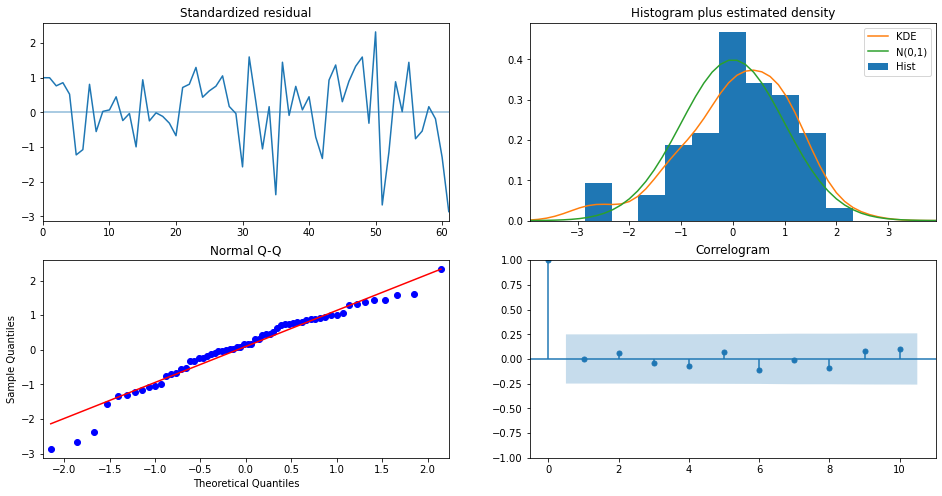

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   63
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 12)   Log Likelihood                -411.987
Date:                            Sun, 01 Aug 2021   AIC                            829.975
Time:                                    19:19:52   BIC                            836.356
Sample:                                         0   HQIC                           832.480
                                             - 63                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2460      0.097     -2.542      0.011      -0.436      -0.056
ar.S.L12       0.3784      0.126      2.997      0.003       0.131       0.626
sigma2      3.064e+04   4852.945      6.314      0.000    2.11e+04    4.02e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 5.49
Prob(Q):                              1.00   Prob(JB):                         0.06
Heteroskedasticity (H):               3.79   Skew:                            -0.69
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.50
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

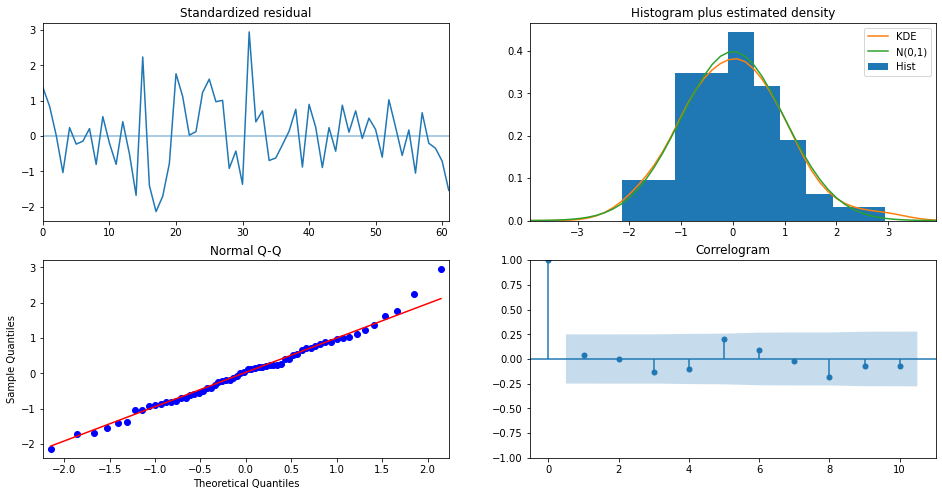

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                   63
Model:             SARIMAX(2, 1, 1)x(2, 0, [], 12)   Log Likelihood                -434.691
Date:                             Sun, 01 Aug 2021   AIC                            881.382
Time:                                     19:19:55   BIC                            894.145
Sample:                                          0   HQIC                           886.393
                                              - 63                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.3197      0.165     -8.018      0.000      -1.642      -0.997
ar.L2         -0.5661      0.111     -5.101      0.000      -0.784      -0.349
ma.L1          0.8918      0.140      6.364      0.000       0.617       1.166
ar.S.L12       0.1837      0.172      1.071      0.284      -0.153       0.520
ar.S.L24       0.2227      0.250      0.890      0.373      -0.267       0.713
sigma2      7.281e+04   1.49e+04      4.873      0.000    4.35e+04    1.02e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.11   Jarque-Bera (JB):                 1.42
Prob(Q):                              0.74   Prob(JB):                         0.49
Heteroskedasticity (H):               0.34   Skew:                             0.33
Prob(H) (two-sided):                  0.02   Kurtosis:                         3.34
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

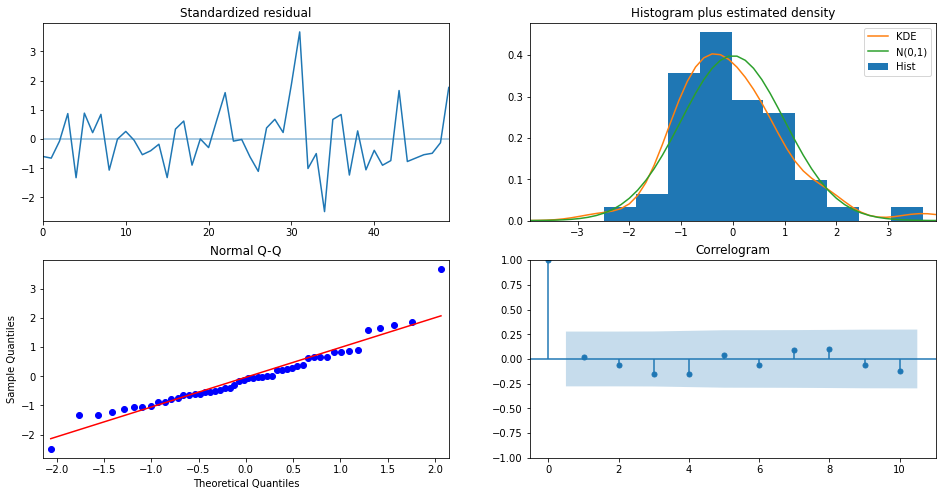

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   63
Model:             SARIMAX(0, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -281.499
Date:                            Sun, 01 Aug 2021   AIC                            566.999
Time:                                    19:19:57   BIC                            570.823
Sample:                                         0   HQIC                           568.455
                                             - 63                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.3158      0.122     -2.595      0.009      -0.554      -0.077
sigma2      4258.8318    593.645      7.174      0.000    3095.310    5422.354
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                17.03
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               2.29   Skew:                             0.92
Prob(H) (two-sided):                  0.10   Kurtosis:                         5.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

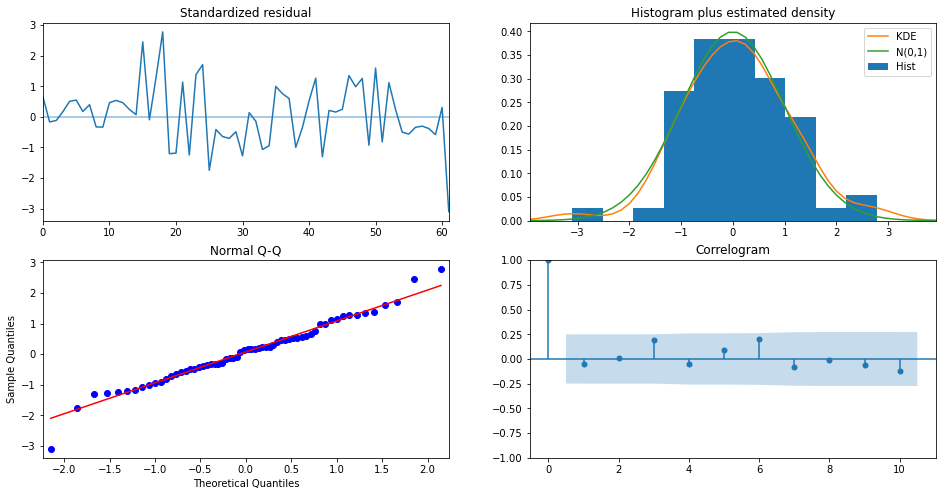

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                   63
Model:             SARIMAX(0, 1, 1)x(1, 0, [], 12)   Log Likelihood                -479.358
Date:                             Sun, 01 Aug 2021   AIC                            964.717
Time:                                     19:20:00   BIC                            971.098
Sample:                                          0   HQIC                           967.222
                                              - 63                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2705      0.117     -2.306      0.021      -0.500      -0.041
ar.S.L12       0.3422      0.142      2.418      0.016       0.065       0.620
sigma2      2.886e+05   4.51e+04      6.399      0.000       2e+05    3.77e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.18   Jarque-Bera (JB):                 1.83
Prob(Q):                              0.68   Prob(JB):                         0.40
Heteroskedasticity (H):               1.18   Skew:                            -0.02
Prob(H) (two-sided):                  0.71   Kurtosis:                         3.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

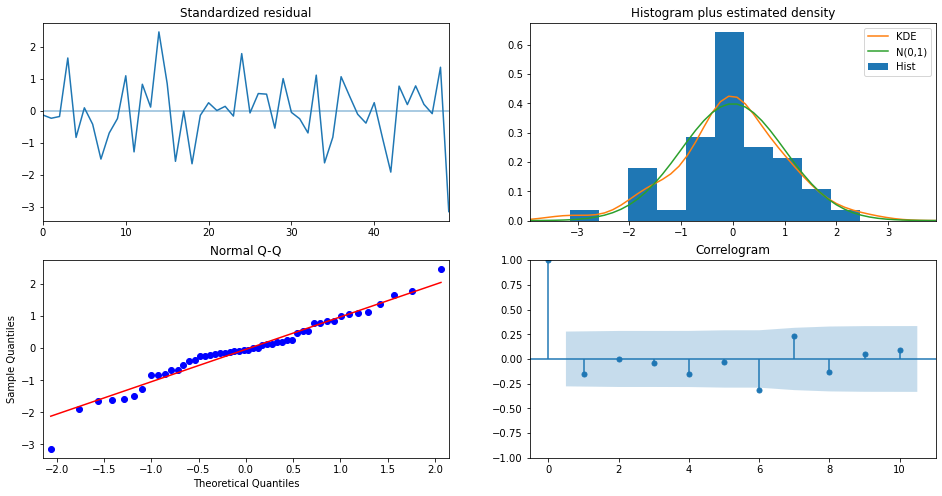

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                   63
Model:             SARIMAX(0, 1, 0)x(0, 1, [1], 12)   Log Likelihood                -290.064
Date:                              Sun, 01 Aug 2021   AIC                            584.127
Time:                                      19:20:03   BIC                            587.951
Sample:                                           0   HQIC                           585.583
                                               - 63                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.S.L12      -0.9753      3.317     -0.294      0.769      -7.477       5.526
sigma2      4323.8951   1.37e+04      0.314      0.753   -2.26e+04    3.13e+04
===================================================================================
Ljung-Box (L1) (Q):                   1.23   Jarque-Bera (JB):                 2.57
Prob(Q):                              0.27   Prob(JB):                         0.28
Heteroskedasticity (H):               1.22   Skew:                            -0.34
Prob(H) (two-sided):                  0.69   Kurtosis:                         3.87
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [60]:
for col in sales_s.columns:
    models[col].plot_diagnostics(figsize=(16, 8))
    plt.show()
    display(models[col].summary())


 # Modélisation univarié par l’approche d’apprentissage automatique
 ## Features engineering

In [62]:
def double_exponential_smoothing(series, alpha=0.9, beta=0.9):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series)+1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series):  # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha*value + (1-alpha)*(level+trend)
        trend = beta*(level-last_level) + (1-beta)*trend
        result.append(level+trend)
    return result

In [63]:
month_in_year = 12
month_quarter = 4
window1 = 3
window2 = 6
window3 = 12

def add_vars(y):
    df = y.copy()
    y_name = df.columns[0]
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    df['month_sin'] = np.sin(2*np.pi*df['month']/month_in_year)
    df['month_cos'] = np.cos(2*np.pi*df['month']/month_in_year)
    df['quarter_sin'] = np.sin(2*np.pi*df['quarter']/month_quarter)
    df['quarter_cos'] = np.cos(2*np.pi*df['quarter']/month_quarter)

    for i in range(1, 13):
        df[f"lag{i}"] = df[y_name].shift(i)
    df["Date"] = y[[y_name]].index

    df.reset_index(drop=True, inplace=True)

    df_rolled_3d = df[[y_name]].rolling(window=window1, min_periods=0)
    df_rolled_7d = df[[y_name]].rolling(window=window2, min_periods=0)
    df_rolled_30d = df[[y_name]].rolling(window=window3, min_periods=0)

    df_mean_3d = df_rolled_3d.mean().shift(1).reset_index().astype(np.float32)
    df_mean_7d = df_rolled_7d.mean().shift(1).reset_index().astype(np.float32)
    df_mean_30d = df_rolled_30d.mean().shift(1).reset_index().astype(np.float32)

    df_std_3d = df_rolled_3d.std().shift(1).reset_index().astype(np.float32)
    df_std_7d = df_rolled_7d.std().shift(1).reset_index().astype(np.float32)
    df_std_30d = df_rolled_30d.std().shift(1).reset_index().astype(np.float32)

    df[f"{y_name}_mean_lag{window1}"] = df_mean_3d[y_name]
    df[f"{y_name}_mean_lag{window2}"] = df_mean_7d[y_name]
    df[f"{y_name}_mean_lag{window3}"] = df_mean_30d[y_name]

    df[f"{y_name}_std_lag{window1}"] = df_std_3d[y_name]
    df[f"{y_name}_std_lag{window2}"] = df_std_7d[y_name]
    df[f"{y_name}_std_lag{window3}"] = df_std_30d[y_name]

    df[f"{y_name}_dbl_exp{'0.9, 0.9'}"] = pd.Series(
        double_exponential_smoothing(df[y_name])).shift(1)

    df.fillna(df.mean(), inplace=True)

    df.set_index("Date", drop=False, inplace=True)
    return df

In [64]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """

    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))

    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    return X_train, X_test, y_train, y_test

def add_vars_plus(df, test_size):
    """
        Add vars 
    """
    ts = df.copy()
    ts = add_vars(ts)
    y_name = ts.columns[0]
    y = ts.dropna()[y_name]
    X = ts.dropna().drop([y_name, 'Date'], axis=1)

    return X, y

In [65]:
scaler = StandardScaler()

def prepare_data(df, test_size=0.15):
    """
        Add vars & return X_train_scaled, X_test_scaled, y_train, y_test
    """
    X, y = add_vars_plus(df, test_size)
    X_train, X_test, y_train, y_test = timeseries_train_test_split(
        X, y, test_size)

    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_scaled = pd.DataFrame(X_train_scaled)
    X_train_scaled.columns = X_train.columns
    X_test_scaled = pd.DataFrame(X_test_scaled)
    X_test_scaled.columns = X_train.columns

    return X_train_scaled, X_test_scaled, y_train, y_test

In [67]:
# for time-series cross-validation set 5 folds
tscv = TimeSeriesSplit(n_splits=5)

In [68]:
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials

def objective(space):
    # Instantiate the classifier
    clf = XGBRegressor(n_estimators=1000, colsample_bytree=space['colsample_bytree'],
                       learning_rate=.3,
                       max_depth=int(space['max_depth']),
                       min_child_weight=space['min_child_weight'],
                       subsample=space['subsample'],
                       gamma=space['gamma'],
                       reg_lambda=space['reg_lambda'])

    eval_set = [(X_train_scaled, y_train), (X_test_scaled, y_test)]

    # Fit the classsifier
    clf.fit(X_train_scaled, y_train,
            eval_set=eval_set, eval_metric="rmse",
            early_stopping_rounds=10, verbose=False)

    # Predict on Cross Validation data
    pred = clf.predict(X_test_scaled)

    # Calculate our Metric - accuracy
    accuracy = accuracy_score(y_test, pred > 0.5)
# return needs to be in this below format. We use negative of accuracy since we want to maximize it.
    return {'loss': -accuracy, 'status': STATUS_OK}

space = {'max_depth': hp.quniform("max_depth", 4, 16, 1),
         'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
         'subsample': hp.uniform('subsample', 0.7, 1),
         'gamma': hp.uniform('gamma', 0.1, 0.5),
         'colsample_bytree': hp.uniform('colsample_bytree', 0.7, 1),
         'reg_lambda': hp.uniform('reg_lambda', 0, 1)
         }

In [72]:
def empty_df_like(df):
    return pd.DataFrame(columns=df.columns, index=df.index)

@meta_decorator("joblib_XGB_sales_s_Models.joblib")
def get_tuned_xgb_for_df(df):
    """find best xgb model for each series in a data frame, returns dict of models"""
    models = {}
    for col in df.columns:
        global X_train_scaled, y_train, X_test_scaled, y_test
        X_train_scaled, X_test_scaled, y_train, y_test = prepare_data(df[[col]])
        trials = Trials()
        best = fmin(fn=objective,
                    space=space,
                    algo=tpe.suggest,
                    max_evals=50,
                    trials=trials)
        best['max_depth'] = int(best['max_depth'])

        models[col] = XGBRegressor(n_estimators=1000, **best)

    return models

xgb_models = get_tuned_xgb_for_df(sales_s)

models imported


In [73]:
def ML_forecast(series, models, test_size=0.15):
    test_index = int(len(series)*(1-test_size))
    n_models = len(models)
    models_errors = [pd.DataFrame(columns=series.columns, index=[
                                  'mape', 'mae', 'rmse', 'mape_exces', 'mape_short']) for x in range(n_models)]
    models_predictions = [empty_df_like(series) for x in range(n_models)]
    models_lower = [empty_df_like(series) for x in range(n_models)]
    models_upper = [empty_df_like(series) for x in range(n_models)]

    test = [empty_df_like(sales_s) for x in range(2)]
    for i, col in enumerate(series.columns):
        global X_train_scaled, y_train, X_test_scaled, y_test
        X_train_scaled, X_test_scaled, y_train, y_test = prepare_data(
            series[[col]], test_size)
        if i == 0:
            models_coeffs = [pd.DataFrame(
                columns=series.columns, index=X_train_scaled.columns) for x in range(n_models)]
        for j in range(n_models):
            if "xgboost" in models[j][0]:
                if "tune" in models[j][0]:
                    models[j][1] = xgb_models[col]

                models[j][1].fit(X_train_scaled, y_train, verbose=False)
                models_coeffs[j][col] = models[j][1].feature_importances_
            else:
                models[j][1].fit(X_train_scaled, y_train)
                models_coeffs[j][col] = models[j][1].coef_

            models_predictions[j][col] = models[j][1].predict(
                pd.concat([X_train_scaled, X_test_scaled]))
            models_errors[j][col] = forecast_accuracy(
                models_predictions[j][col][test_index:], y_test)

            cv = cross_val_score(models[j][1], X_train_scaled, y_train,
                                 cv=tscv,
                                 scoring="neg_mean_absolute_error")
            mae = cv.mean() * (-1)
            deviation = cv.std()

            scale = 1.96
            models_lower[j][col] = models_predictions[j][col] - \
                (mae + scale * deviation)
            models_upper[j][col] = models_predictions[j][col] + \
                (mae + scale * deviation)

    models_predictions = {models[i][0]: pred for i,
                          pred in enumerate(models_predictions)}
    models_lower = {models[i][0]: pred for i, pred in enumerate(models_lower)}
    models_upper = {models[i][0]: pred for i, pred in enumerate(models_upper)}
    models_errors = {models[i][0]: pred for i,
                     pred in enumerate(models_errors)}
    models_coeffs = {models[i][0]: pred for i,
                     pred in enumerate(models_coeffs)}

    return {'models_predictions': models_predictions, 'models_lower': models_lower, 'models_upper': models_upper, 
            'models_errors': models_errors, 'models_coeffs': models_coeffs, 'test_index': test_index}

In [74]:
def df_template(model_data): 
    return empty_df_like(list(ML_forecast_res[model_data].values())[0])

def best_models(ML_forecast_res, criterion):
    best_predictions, models_lower, models_upper, models_errors, models_coeffs = map(
        df_template, ('models_predictions', 'models_lower', 'models_upper', 'models_errors', 'models_coeffs'))

    ML_forecast_error = {model_name: df.loc[criterion]
                         for model_name, df in ML_forecast_res['models_errors'].items()}
    ML_forecast_error_df = pd.DataFrame(ML_forecast_error)

    best_models = ML_forecast_error_df.idxmin(axis=1)

    for col in best_predictions.columns:
        best_model = best_models[col]
        best_predictions[col] = ML_forecast_res['models_predictions'][best_model][col]
        models_lower[col] = ML_forecast_res['models_lower'][best_model][col]
        models_upper[col] = ML_forecast_res['models_upper'][best_model][col]
        models_errors[col] = ML_forecast_res['models_errors'][best_model][col]
        models_coeffs[col] = ML_forecast_res['models_coeffs'][best_model][col]

    return {'best_predictions': best_predictions, 'models_lower': models_lower, 'models_upper': models_upper, 
            'models_errors': models_errors, 'models_coeffs': models_coeffs, 'best_models': best_models, 
            'criterion': criterion, 'test_index': ML_forecast_res['test_index']}

In [76]:
def plotCoefficients(model_coeff, features_names, model_name, item, axs):
    """
        Plots sorted coefficient values of the model
    """
    coefs = pd.DataFrame(model_coeff, features_names)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)

    axs.bar(coefs.index, coefs.coef)
    axs.tick_params(axis='x', labelrotation=90)
    axs.grid(True, axis='y')
    axs.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed')
    axs.set_title(
        f"{item}, Features importance of {'xgboost' if 'xgboost' in model_name else model_name}")


def plot_forecast_ML(forecast_data, df, plot_train_fc=False, plot_anomalies=True, plot_coeff=False):
    n_series = len(df.columns)
    test_index = forecast_data['test_index']
    fig_n_lines = ceil(n_series/2)
    if n_series > 1:
        fig, axs = plt.subplots(fig_n_lines, 2, figsize=(20, fig_n_lines*4))
        remove_axes(n_series, axs)
        axs = axs.flatten()
    else:
        fig, axs = plt.subplots(fig_n_lines, 1, figsize=(15, 7))
        axs = [axs]

    for i, item in enumerate(df.columns):
        axs[i].plot(df[item], label="actual")
        axs[i].plot(forecast_data['best_predictions'][item]
                    [0 if plot_train_fc else test_index:], color='darkgreen', label="forecast")
        axs[i].set_title(f"{item},  model : {'xgboost' if 'xgboost' in forecast_data['best_models'][item] else forecast_data['best_models'][item]},  {forecast_data['criterion']} : {forecast_data['models_errors'][item][forecast_data['criterion']]:.2f} { '%' if forecast_data['criterion']=='mape' else ''}")

        lower = forecast_data['models_lower'][item][test_index:]
        upper = forecast_data['models_upper'][item][test_index:]
        axs[i].plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        axs[i].plot(upper, "r--", alpha=0.5)

        y_test = df[item][test_index:]
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test < lower] = y_test[y_test < lower]
            anomalies[y_test > upper] = y_test[y_test > upper]
            anomalies_series = pd.Series(anomalies, index=y_test.index)
            if ~np.isnan(anomalies).all():
                axs[i].plot(anomalies_series[-len(y_test):], "o",
                            markersize=10, label="Anomalies")

        axs[i].axvspan(lower.index[0], lower.index[-1],
                       color=sns.xkcd_rgb['grey'], alpha=0.2)

        axs[i].legend(loc="best")

    # plot features importance
    if plot_coeff:
        features_names = forecast_data['models_coeffs'].index
        if n_series > 1:
            fig, axs = plt.subplots(
                fig_n_lines, 2, figsize=(16, fig_n_lines*5))

            remove_axes(n_series, axs)
            axs = axs.flatten()
        else:
            fig, axs = plt.subplots(fig_n_lines, 1, figsize=(13, 7))
            axs = [axs]

        for i, item in enumerate(df.columns):
            plotCoefficients(forecast_data['models_coeffs'][item], features_names,
                             forecast_data['best_models'][item], item, axs[i])

        fig.tight_layout()


def full_forecast(series, models, test_size=0.15, criterion='mape', plot_train_fc=False, plot_anomalies=True, plot_coeff=False, return_errors=False):
    ML_forecast_res = ML_forecast(sales_s, models, test_size)
    res = best_models(ML_forecast_res, criterion)
    plot_forecast_ML(res, series, plot_train_fc, plot_anomalies, plot_coeff)
    if return_errors:
        return ML_forecast_res['models_errors']

lr = LinearRegression()
ridge = RidgeCV(cv=tscv)
lasso = LassoCV(cv=tscv)

 Pour la démonstration de la demarche suivie dans l'apprentissage supervisé, on a selectionné aléatoirement un produit (P_64).

In [79]:
sales_s_p64 = sales_s[['P_64']]
sales_s_p64.head()

,P_64
2014-07-31,1039
2014-08-31,1134
2014-09-30,1160
2014-10-31,1180
2014-11-30,1065



 On a commencé par implémenter le concept de "feature engineering" ou on a généré les variables nécessaires pour entrainer les modèles d'apprentissage.

 - Variables de temps : année, mois, trimestre
 - Valeurs retardées des séries temporelles
 - Statistiques : la moyenne et l'écart type des valeurs retardées.

 Les variables temporelles tels que le mois et le trimestre sont cycliques. Par exemple, le mois oscille entre 1 et 12 pour chaque année. Alors que la différence entre chaque mois augmente de 1 au cours de l'année, entre deux ans, la caractéristique du mois passe de 12 (décembre) à 1 (janvier). Il en résulte une différence de -11, ce qui peut dérouter beaucoup de modèles.


In [80]:
demo = sales_s_p64.copy()
demo['year'] = demo.index.year
demo['month'] = demo.index.month
demo['quarter'] = demo.index.quarter
demo.tail()

,P_64,year,month,quarter
2019-05-31,1634,2019,5,2
2019-06-30,1597,2019,6,2
2019-07-31,1560,2019,7,3
2019-08-31,1817,2019,8,3
2019-09-30,1618,2019,9,3


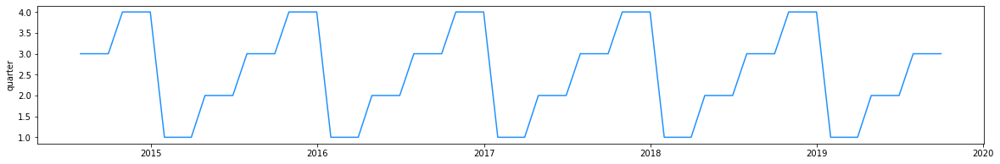

In [81]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 3))
sns.lineplot(x=demo.index, y=demo['quarter'], color='dodgerblue')
# ax.set_xlim(["2014-07-31", "2019-09-30"])
plt.show()

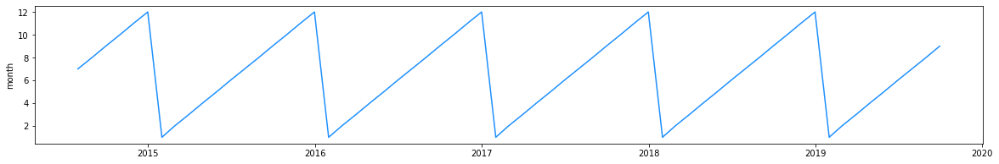

In [82]:
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 3))
sns.lineplot(x=demo.index, y=demo['month'], color='dodgerblue')
# ax.set_xlim(["2014-07-31", "2019-09-30"])
plt.show()

 Pour résoudre ce problème, on a effectué une transformation par la fonction cosinus après avoir normalisé les variables entre 0 et 2π, ce qui correspond à un cycle de cosinus, cette solution ne régle pas le problème complétement car deux valeurs différentes peuvent avoir la même image par la fonction cosinus. La meilleure façon de résoudre ce nouveau problème était d'ajouter une autre information cyclique pour distinguer deux temps avec des valeurs de cosinus identiques, il s'agit de la fonction sinus. Nous pourrions le considérer comme un système de coordonnées à deux axes.

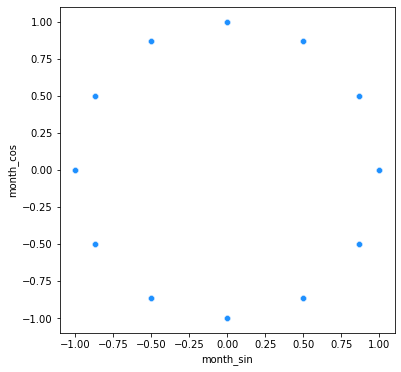

In [83]:
month_in_year = 12
demo['month_sin'] = np.sin(2*np.pi*demo['month']/month_in_year)
demo['month_cos'] = np.cos(2*np.pi*demo['month']/month_in_year)
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
sns.scatterplot(x=demo.month_sin, y=demo.month_cos, color='dodgerblue')
plt.show()

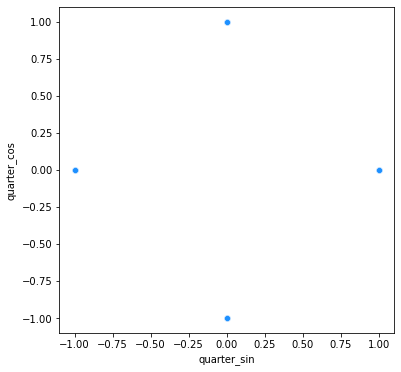

In [84]:
month_quarter = 4
demo['quarter_sin'] = np.sin(2*np.pi*demo['quarter']/month_quarter)
demo['quarter_cos'] = np.cos(2*np.pi*demo['quarter']/month_quarter)
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
sns.scatterplot(x=demo.quarter_sin, y=demo.quarter_cos, color='dodgerblue')
plt.show()

In [85]:
demo.head()

,P_64,year,month,quarter,month_sin,month_cos,quarter_sin,quarter_cos
2014-07-31,1039,2014,7,3,-0.500000,-8.660254e-01,-1.000000e+00,-1.836970e-16
2014-08-31,1134,2014,8,3,-0.866025,-5.000000e-01,-1.000000e+00,-1.836970e-16
2014-09-30,1160,2014,9,3,-1.000000,-1.836970e-16,-1.000000e+00,-1.836970e-16
2014-10-31,1180,2014,10,4,-0.866025,5.000000e-01,-2.449294e-16,1.000000e+00
2014-11-30,1065,2014,11,4,-0.500000,8.660254e-01,-2.449294e-16,1.000000e+00


 Comme indiqué précédemment, on a utilisé les variables de la série décalées pour beneficier de l'autocorrélation existante dans la série. Pour prendre en compte l'effet de la saisonnalité, on a considéré 12 retards.

In [86]:
for i in range(1, 13):
    demo[f"lag{i}"] = demo.P_64.shift(i)

In [87]:
demo2 = demo.copy()
demo2["Date"] = demo[['P_64']].index

 On a généré les moyennes mobiles et ecart-types mobiles (trimestrielle, semestrielle et annuelle) des valeurs décalées afin de détecter la tendance globale des données.

In [88]:
demo2.reset_index(drop=True, inplace=True)
window1 = 3
window2 = 6
window3 = 12

df_rolled_3d = demo2[["P_64"]].rolling(window=window1, min_periods=0)
df_rolled_7d = demo2[["P_64"]].rolling(window=window2, min_periods=0)
df_rolled_30d = demo2[["P_64"]].rolling(window=window3, min_periods=0)

df_mean_3d = df_rolled_3d.mean().shift(1).reset_index().astype(np.float32)
df_mean_7d = df_rolled_7d.mean().shift(1).reset_index().astype(np.float32)
df_mean_30d = df_rolled_30d.mean().shift(1).reset_index().astype(np.float32)

df_std_3d = df_rolled_3d.std().shift(1).reset_index().astype(np.float32)
df_std_7d = df_rolled_7d.std().shift(1).reset_index().astype(np.float32)
df_std_30d = df_rolled_30d.std().shift(1).reset_index().astype(np.float32)

demo2[f"{'P_64'}_mean_lag{window1}"] = df_mean_3d["P_64"]
demo2[f"{'P_64'}_mean_lag{window2}"] = df_mean_7d["P_64"]
demo2[f"{'P_64'}_mean_lag{window3}"] = df_mean_30d["P_64"]

demo2[f"{'P_64'}_std_lag{window1}"] = df_std_3d["P_64"]
demo2[f"{'P_64'}_std_lag{window2}"] = df_std_7d["P_64"]
demo2[f"{'P_64'}_std_lag{window3}"] = df_std_30d["P_64"]

demo2[f"{'P_64'}_dbl_exp{'0.9, 0.9'}"] = pd.Series(
    double_exponential_smoothing(demo2["P_64"])).shift(1)


demo2.fillna(demo2.mean(), inplace=True)

demo2.set_index("Date", drop=True, inplace=True)
demo2.head()

,P_64,year,month,quarter,month_sin,month_cos,quarter_sin,quarter_cos,lag1,lag2,...,lag10,lag11,lag12,P_64_mean_lag3,P_64_mean_lag6,P_64_mean_lag12,P_64_std_lag3,P_64_std_lag6,P_64_std_lag12,"P_64_dbl_exp0.9, 0.9"
Date,,,,,,,,,,,,,,,,,,,,,
2014-07-31,1039,2014,7,3,-0.500000,-8.660254e-01,-1.000000e+00,-1.836970e-16,1406.209677,1399.47541,...,1368.113208,1360.788462,1352.509804,1395.29834,1382.994995,1358.878906,60.828255,81.603775,99.325943,1417.90477
2014-08-31,1134,2014,8,3,-0.866025,-5.000000e-01,-1.000000e+00,-1.836970e-16,1039.000000,1399.47541,...,1368.113208,1360.788462,1352.509804,1039.00000,1039.000000,1039.000000,60.828255,81.603775,99.325943,1039.00000
2014-09-30,1160,2014,9,3,-1.000000,-1.836970e-16,-1.000000e+00,-1.836970e-16,1134.000000,1039.00000,...,1368.113208,1360.788462,1352.509804,1086.50000,1086.500000,1086.500000,67.175148,67.175148,67.175148,1229.00000
2014-10-31,1180,2014,10,4,-0.866025,5.000000e-01,-2.449294e-16,1.000000e+00,1160.000000,1134.00000,...,1368.113208,1360.788462,1352.509804,1111.00000,1111.000000,1111.000000,63.694584,63.694584,63.694584,1206.01000
2014-11-30,1065,2014,11,4,-0.500000,8.660254e-01,-2.449294e-16,1.000000e+00,1180.000000,1160.00000,...,1368.113208,1360.788462,1352.509804,1158.00000,1128.250000,1128.250000,23.065125,62.409267,62.409267,1200.64290


 ## Modèles de régression
 ### Régression linéaire multiple
 On a ajusté un modèle de regression linéaire multiple sur l'ensemble des variables.

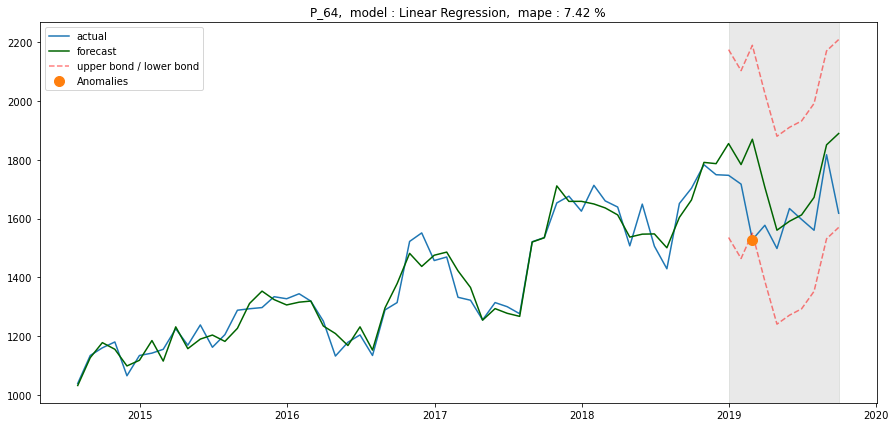

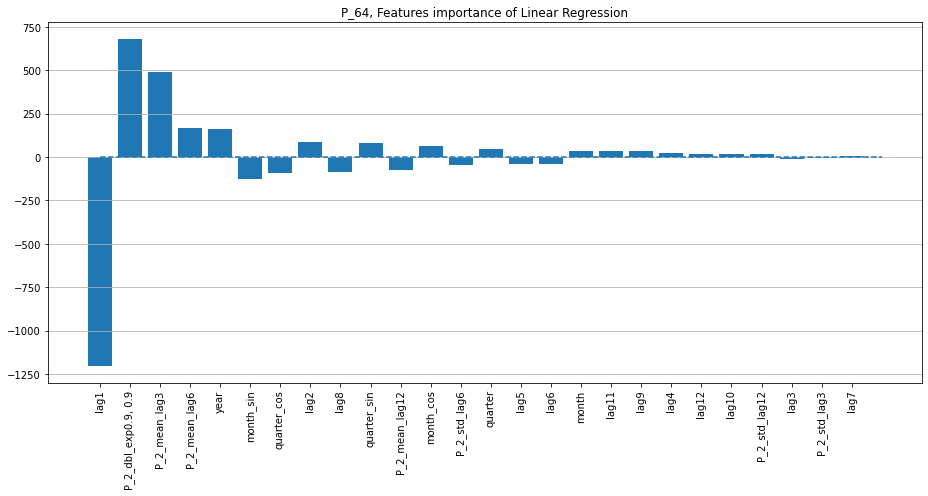

In [89]:
full_forecast(sales_s_p64, [["Linear Regression", lr]],
              plot_train_fc=True, plot_coeff=True)

 On peut observer que la courbe de régression est collée à la série temporelle du produit, ce qui indique qu’il s’agit d’un modèle complexe et flexible qui surapprend les données d’entrainement (un biais faible) mais conduit à des erreurs plus importantes sur les nouvelles données (une variance élevée).
 La figure de l’importance des variables confirme le surapprentissage. En effet, le modèle concentre toutes ses forces sur les variables du temps et néglige l’information inclue dans les autres variables.
 Lorsque les variables indépendantes sont corrélées, cela indique que les changements dans une variable sont associés à des changements dans une autre variable. Plus la corrélation est forte, plus il est difficile de changer une variable sans en changer une autre. Il devient difficile pour le modèle d'estimer la relation entre chaque variable indépendante et la variable dépendante indépendamment parce que les variables indépendantes ont tendance à changer à l'unisson.
 Dans notre cas, plusieurs variables sont fortement corrélées comme l’indique le corrélogramme suivant :

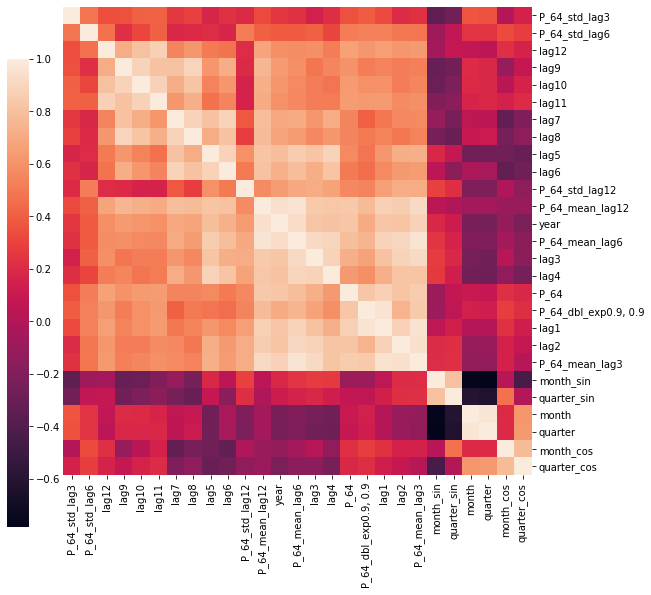

In [90]:
cg = sns.clustermap(demo2.corr(), figsize=(
    10, 10), cbar_pos=(.1, .1, .03, .65))
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
plt.show()

 D'autre part, puisqu’on a différentes échelles dans les variables, celles-ci doivent être transformées en une même échelle pour explorer l'importance des caractéristiques et être utilisés par la suite dans la régularisation.

 ### modèles de régularisation : Ridge et Lasso
 Pour une meilleure optimisation des variables explicatives, on a  appliqué la régularisation. Deux des modèles de régression avec régularisation les plus populaires sont les régressions Ridge et Lasso. Ils ajoutent tous deux des contraintes supplémentaires à notre fonction de perte.

 Dans le cas de la régression Ridge, ces contraintes sont la somme des carrés des coefficients multipliée par le coefficient de régularisation. Plus le coefficient d'une caractéristique est grand, plus notre perte sera importante. Par conséquent, nous essaierons d'optimiser le modèle tout en gardant les coefficients assez bas.

 À la suite de cette régularisation L2, nous aurons un biais plus élevé et une variance plus faible, donc le modèle se généralisera mieux.

 Le deuxième modèle de régression, la régression Lasso, ajoute à la fonction de perte, non pas des carrés, mais des valeurs absolues des coefficients. Par conséquent, au cours du processus d'optimisation, les coefficients des caractéristiques sans importance peuvent devenir des zéros, ce qui permet une sélection automatisée des caractéristiques. Ce type de régularisation est appelé L1.
 Les prévisions par les deux régularisations ainsi que le graphique de l’importance des variables sont présentées dans les figures suivantes :

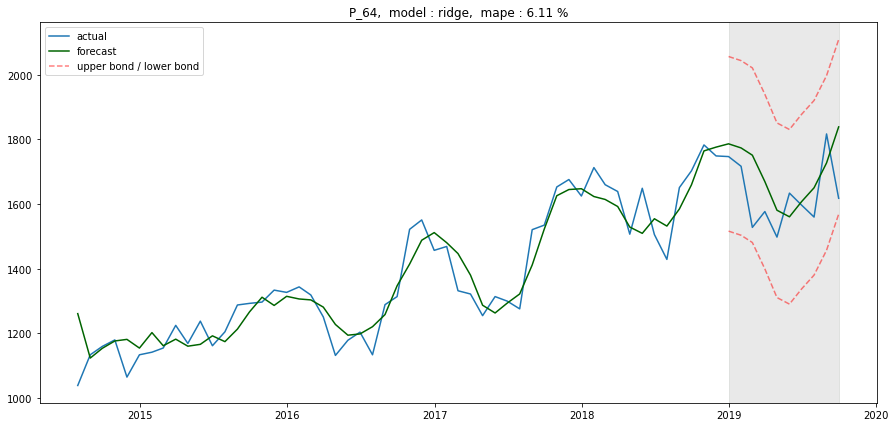

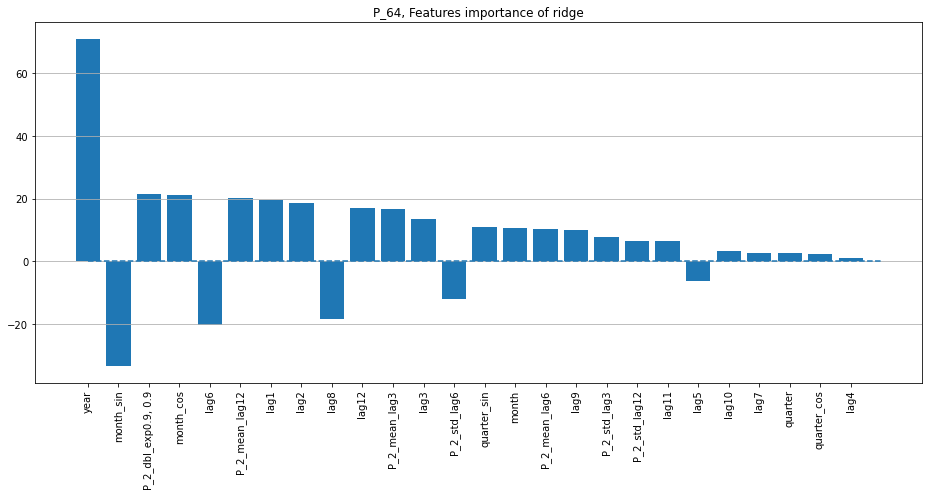

In [91]:
full_forecast(sales_s_p64, [["ridge", ridge]],
              plot_train_fc=True, plot_coeff=True)

 On peut remarquer que la qualité d’ajustement s’est améliorée par la régression Ridge, l’erreur sur le train set est la même que l’erreur sur le test set, donc le modèle ne surapprend pas les données d’entrainement et le problème de surapprentissage est réglé.
 On peut également remarquer que les intervalles de prédiction sont moins larges que dans la régression linéaire.
 Nous pouvons clairement voir que certains coefficients se rapprochent de plus en plus de zéro (bien qu'ils ne l'atteignent jamais réellement) à mesure que leur importance dans le modèle diminue.

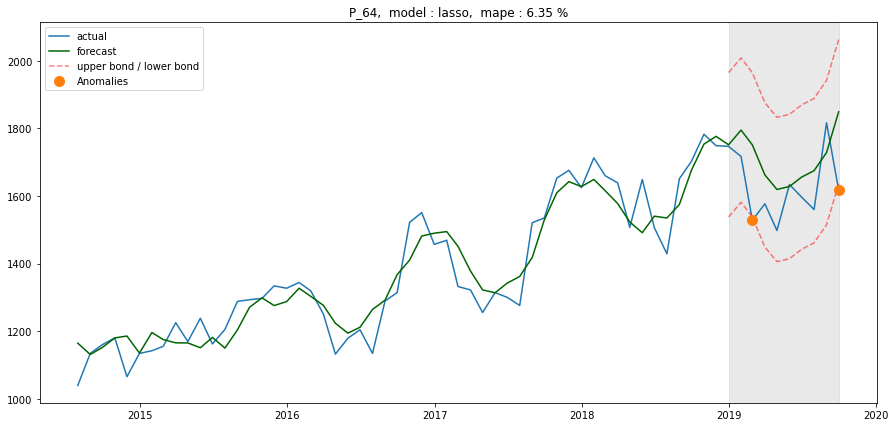

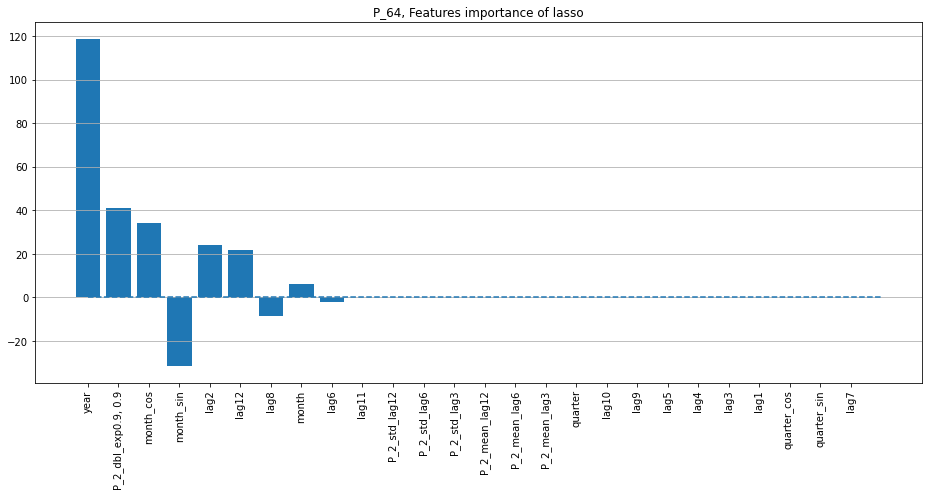

In [92]:
full_forecast(sales_s_p64, [["lasso", lasso]],
              plot_train_fc=True, plot_coeff=True)

 De même que la régression Ridge, la régression Lasso permet de régler le problème de surapprentissage.
 La régression au lasso s'est avérée plus conservatrice, le modèle elle a supprimé plusieurs variables.

 La figure ci-dessous représente les prévisions pour chaque produit par le modèle qui minimise l'erreur (MAPE) parmis les deux modèles de régularisation.

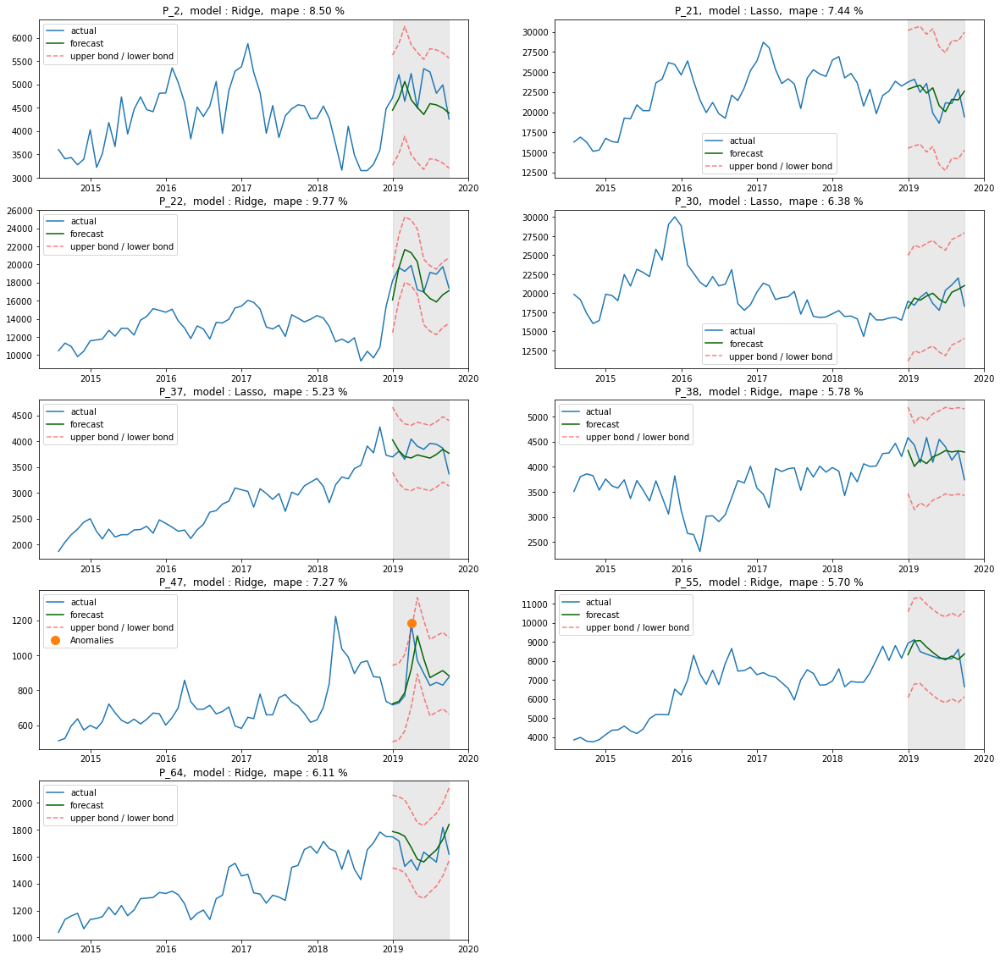

In [93]:
full_forecast(sales_s, [["Lasso", lasso], ["Ridge", ridge]])

 ## Gradient Boosting : XGBoost

 On a effectué les prévisions par un autre modèle d’apprentissage, à savoir XGBoost. Ce modèle est très performant sur beaucoup de problèmes de prédiction, évaluons sa performance sur notre problème de prévision des séries temporelles.
 L’implémentation XGBoost du grandient Boosting propose plusieurs hyperparamètres tel que :
 -Max_depth : Profondeur maximale d'un arbre. L'augmentation de cette valeur rendra le modèle plus complexe et plus susceptible de surapprentissage.
 -colsample_bytree est le sous-échantillon des colonnes considéré lors de la construction de chaque arbre. Le sous-échantillonnage a lieu une fois pour chaque arbre construit.
 -max_leaves :Nombre maximum de nœuds à ajouter.
 On considère encore une fois le produit P_64, on a essayé plusieurs combinaisons des hyperparamètres jusqu’à trouver la combinaison optimale qui minimise l’erreur (MAPE), on a entrainé le modèle en utilisant cette dernière, les prévisions données sont présentées dans le graphique ci-dessous.

In [94]:
best = {'colsample_bytree': 0.7855436372368847,
        'gamma': 0.2715026337470021,
        'max_depth': 11,
        'min_child_weight': 1.0,
        'reg_lambda': 0.358974472027333,
        'subsample': 0.8129759325416941}

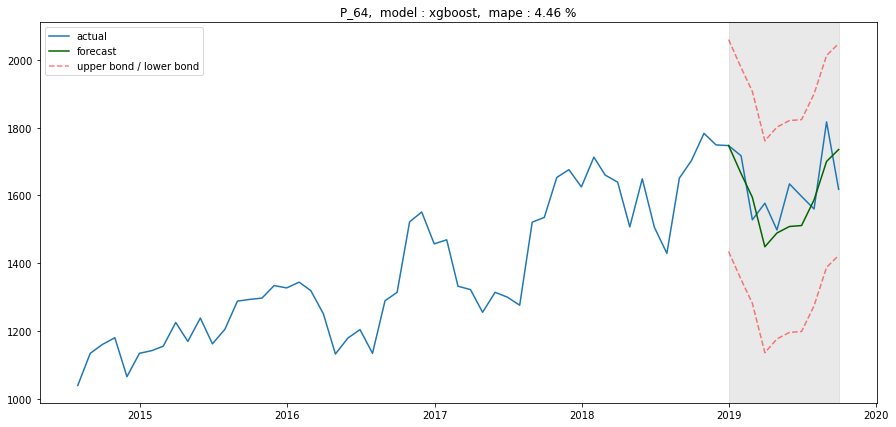

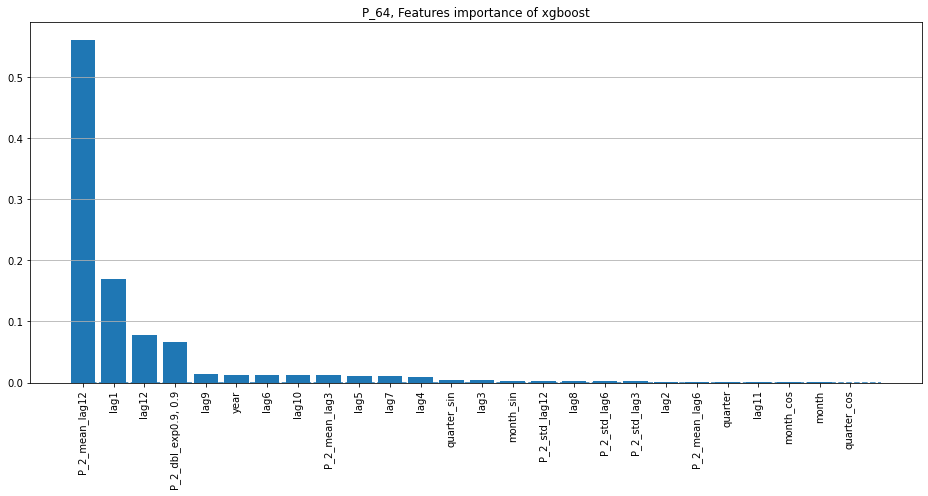

In [95]:
reg = XGBRegressor(n_estimators=1000, **best)
full_forecast(sales_s_p64, [["default_xgboost", reg]], plot_coeff=True)

 On a réeffectué le tunning pour chacun des produits, choisi la combinaison des hyperparamètres qui minimise l’erreur et ajusté un modèle adapté. Le tableau ci-dessous présente l’erreur des modèles entrainés et testé sur le test set pour chaque produit.

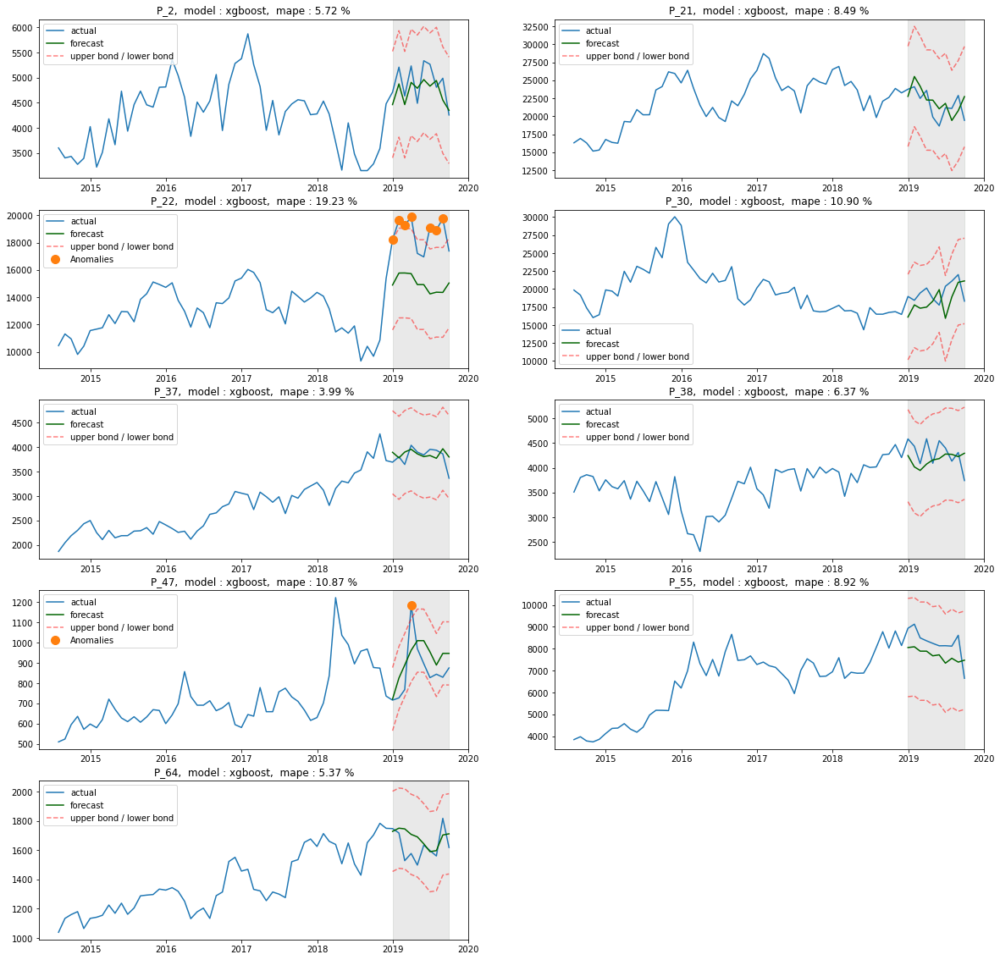

In [96]:
full_forecast(sales_s, [["tuned_xgboost", 0], [
              "default_xgboost", XGBRegressor(n_estimators=1000)]])

 Finalement, pour chaque produit on a retenu le modèle qui minimise l’erreur sur le test set parmi les modèles d’apprentissage supervisé testés : RLM, Ridge, Lasso, XGBoost.
 Les prévisions données par le modèle qui minimise l’erreur pour chaque produit ainsi que son erreur sur le test set sont présentées dans le graphique suivant.

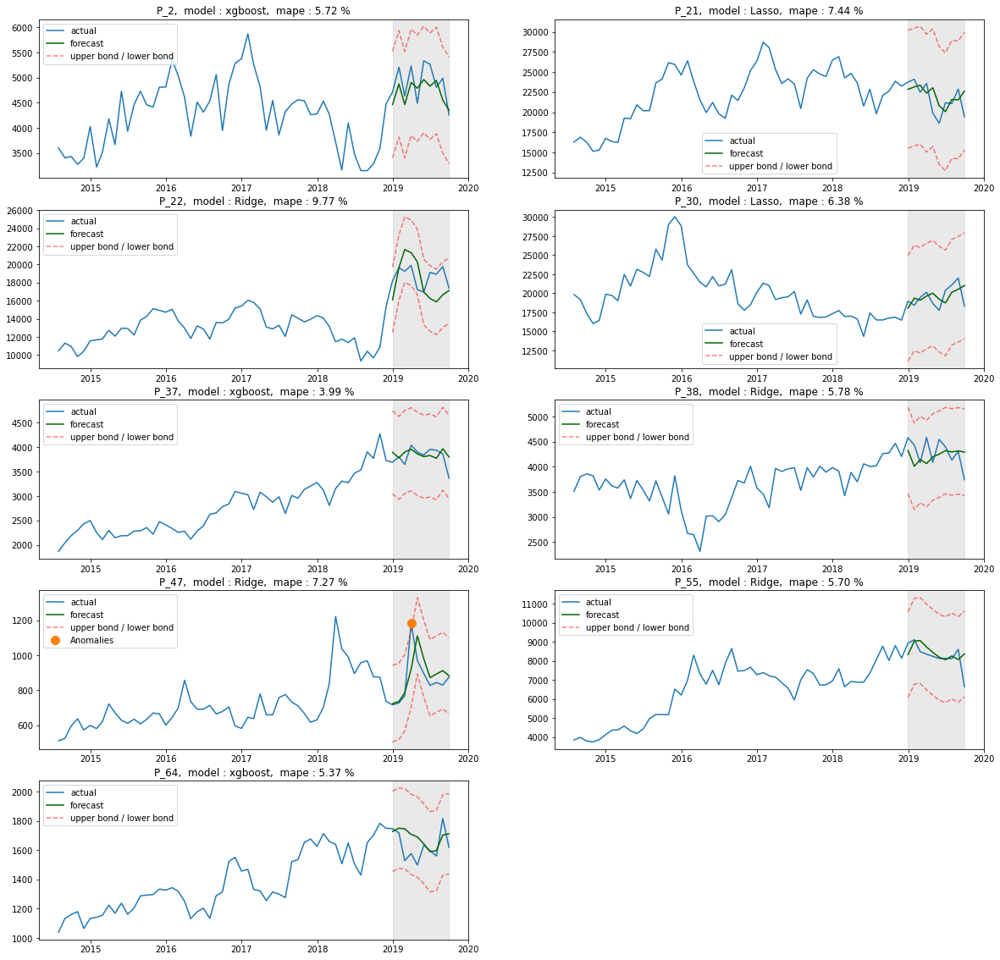

In [97]:
errors_ML = full_forecast(sales_s, [["tuned_xgboost", 0], ["default_xgboost", XGBRegressor(
    n_estimators=1000)],                                 ["Lasso", lasso], ["Ridge", ridge]], return_errors=True)
errors_LASSO = errors_ML['Lasso']
errors_RIDGE = errors_ML['Ridge']
errors_XGB = errors_ML['tuned_xgboost'].combine(
    errors_ML['default_xgboost'], np.minimum)

 ## Comparaison des modèles univariés

In [98]:
print("Performance des modèles ARIMA")
display(pretty_df(errors_ARIMA))
print("Performance des modèles Lasso")
display(pretty_df(errors_LASSO))
print("Performance des modèles Ridge")
display(pretty_df(errors_RIDGE))
print("Performance des modèles XGBoost")
display(pretty_df(errors_XGB))

Performance des modèles ARIMA


Series,P_2,P_21,P_22,P_30,P_37,P_38,P_47,P_55,P_64
mape,7.988069,7.568128,6.642814,7.220782,4.425410,4.214090,6.252274,5.196195,4.623019
mae,387.221975,1564.656418,1217.111111,1393.555556,163.513238,173.036548,57.878158,386.609802,75.191947
rmse,189287.398949,3784128.329439,2322438.000000,2951031.555556,48702.964300,43181.137813,5392.836057,363277.664755,10311.821486
mape_exces,50.373516,65.167297,56.453425,55.367526,71.799478,81.532549,52.711708,90.776528,65.664289
mape_short,49.626484,34.832703,43.546575,44.632474,28.200522,18.467451,47.288292,9.223472,34.335711


Performance des modèles Lasso


Series,P_2,P_21,P_22,P_30,P_37,P_38,P_47,P_55,P_64
mape,9.416955,7.437596,17.384725,6.379421,5.228139,7.064517,8.703817,6.070752,6.354346
mae,475.232733,1544.363129,3287.302105,1231.255458,196.929509,311.940892,81.033190,467.284200,101.256893
rmse,312739.192093,3223700.543913,12179651.913281,1914552.951384,57280.185574,146477.545052,10538.936223,444129.717412,15615.163900
mape_exces,11.625792,67.822665,0.000000,55.217445,43.079247,10.067626,78.266927,82.791904,91.795667
mape_short,88.374208,32.177335,100.000000,44.782555,56.920753,89.932374,21.733073,17.208096,8.204333


Performance des modèles Ridge


Series,P_2,P_21,P_22,P_30,P_37,P_38,P_47,P_55,P_64
mape,8.498445,7.965117,9.774077,8.042788,5.288403,5.781431,7.265684,5.702075,6.111311
mae,430.686597,1633.352506,1835.061394,1575.043462,200.590973,246.749837,70.612940,438.153955,97.981851
rmse,257371.172099,4109095.403062,4910138.505001,2810097.386971,62388.238632,95853.275814,10879.529040,417700.068685,14054.447499
mape_exces,14.734109,94.387208,38.413783,32.384629,40.968647,39.833059,69.244563,74.312394,84.589821
mape_short,85.265891,5.612792,61.586217,67.615371,59.031353,60.166941,30.755437,25.687606,15.410179


Performance des modèles XGBoost


Series,P_2,P_21,P_22,P_30,P_37,P_38,P_47,P_55,P_64
mape,5.721726,8.492950,19.234261,10.899236,3.989604,6.366763,10.866598,8.922379,5.373648
mae,284.962598,1787.232031,3627.852441,2129.272461,146.209033,262.898145,96.215039,737.550244,85.224304
rmse,94266.661041,3742667.802374,14366716.372348,5850626.380852,35824.993375,104878.521805,12573.262009,604937.429904,12469.272205
mape_exces,10.464533,68.219744,0.000000,14.191142,70.368733,30.955695,82.645992,13.963141,78.425029
mape_short,79.666278,20.228395,100.000000,74.826346,9.644545,23.608656,17.313381,76.683393,14.541934


 # Modélisation multivariée : Vector AutoRegressif Moving Average (VARMA)
 Dans cette section, on a exploité le clustering effectué auparavant en s’intéressant à l’ensemble des produits d’un même groupe (Cluster). Ayant des comportements de ventes similaires, ces produits peuvent s'influencer mutuellement et par la suite l’information supplémentaire sur les évolutions des autres produits peut améliorer la qualité du modèle.
 On dispose de 9 clusters, Pour la démonstration on considère le cluster qui comporte les produits :P_3, P_21, P_23, P_24, P_25, P_27.
 Visuellement, on peut constater que les produits ont des évolutions similaires avec des effets de saisonnalité semblables.

In [100]:
def choose_d(l):
    return list(sorted(l))[1]


def Oui_non(x):
    return "Oui" if x else "Non"


def test_all(y):
    y = y.dropna()
    n_ch = nsdiffs(remove_trend(
        y)["serie"].dropna(), m=12, max_D=12, test='ch')
    n_ocsb = nsdiffs(remove_trend(
        y)["serie"].dropna(), m=12, max_D=12, test='ocsb')
    n_adf = ndiffs(y, test='adf')
    n_kpss = ndiffs(y, test='kpss')
    n_pp = ndiffs(y, test='pp')
    return (Oui_non(n_ch), Oui_non(n_ocsb), max(n_ch, n_ocsb), Oui_non(n_adf), Oui_non(n_kpss), Oui_non(n_pp), choose_d((n_adf, n_kpss, n_pp)))


def multiple_test_all(df):
    res = pd.DataFrame(df.columns, columns=["Series"])
    res[1], res[2], res[3], res[4], res[5], res[6], res[7] = [
        [test_all(df[i])[j] for i in df.columns] for j in range(7)]
    res = res.set_index("Series")
    res.columns = ["Canova-Hansen", "OCSB", "Seasonality Order",
                   "ADF", "KPSS", "PP", "differencing order"]
    return res

def remove_trend(y):
    n_adf = ndiffs(y, test='adf')
    n_kpss = ndiffs(y, test='kpss')
    n_pp = ndiffs(y, test='pp')
    n_diff = max(n_adf, n_kpss, n_pp)
    for i in range(n_diff):
        y = y.diff(1)
    return {"serie": y, "n_diff": n_diff}


def stationnarise(y):
    y, n_diff = remove_trend(y).values()
    y = y.dropna()
    n_ch = nsdiffs(y, m=12, max_D=12, test='ch')
    n_ocsb = nsdiffs(y, m=12, max_D=12, test='ocsb')
    n_sdiff = max(n_ch, n_ocsb)
    for i in range(n_sdiff):
        y = y.diff(12)
    return {"serie": y, "n_diff": n_diff, "n_sdiff": n_sdiff}

def series_from_summary(summary):
    return pd.DataFrame([dic['serie'] for dic in summary.values()]).T


def orders_from_summary(summary):
    return [(dic["n_diff"], dic["n_sdiff"]) for dic in summary.values()]

In [103]:
def diff_inv_wrapper(train, diff_test, lags=1, differences=1):
    last_train = train[-lags:]
    added_orig = pd.concat([last_train, diff_test])
    X_diff_inv = diff_test.copy()
    X_diff_inv.iloc[:, 0] = diff_inv(
        added_orig, lag=lags, differences=differences)[-len(diff_test):]
    return X_diff_inv

def undiff_d1_D1(train, diff_test):
    diff_train_s = train.diff(1)[-12:]
    unseasonal_test = diff_inv_wrapper(diff_train_s, diff_test, lags=12)
    return diff_inv_wrapper(train, unseasonal_test, lags=1)

def invert_transformation(train, test, d=1, D=0):
    if d == 1 and D == 1:
        return undiff_d1_D1(train, test)
    elif d == 1 and D == 0:
        return diff_inv_wrapper(train, test)
    elif d == 0 and D == 1:
        return diff_inv_wrapper(train, test, lags=12)
    elif d == 0 and D == 0:
        return test
    else:
        raise ValueError("unexpected case")

def remove_axes(n_used_axes, all_axs):
    if n_used_axes % 2:
        all_axs = all_axs.flatten()
        size = len(all_axs)
        for useless_ax in all_axs.flatten()[-(size - n_used_axes):]:
            useless_ax.axis('off')

In [107]:
cluster_count = len(np.unique(labels))
clusters = [[] for _ in range(cluster_count)]
for i, lab in enumerate(labels):
    clusters[lab].append(i)
clusters_n = ["cluster_"+str(i) for i in range(cluster_count)]
cluster_p = {}
for cluster, cluster_n in zip(clusters, clusters_n):
    cluster_p[cluster_n] = [sales.columns[p] for p in cluster]
# cluster_p

In [108]:
cluster_7 = sales[cluster_p['cluster_7']]
cluster_7.head()

,P_3,P_21,P_23,P_24,P_25,P_27
2014-07-31,3506,16302,21457,7204,11457,12851
2014-08-31,3279,16907,22408,7477,12571,13270
2014-09-30,3238,16286,21252,7592,12643,12860
2014-10-31,3088,15147,20512,7435,13066,12857
2014-11-30,2921,15298,22433,7434,13917,15042


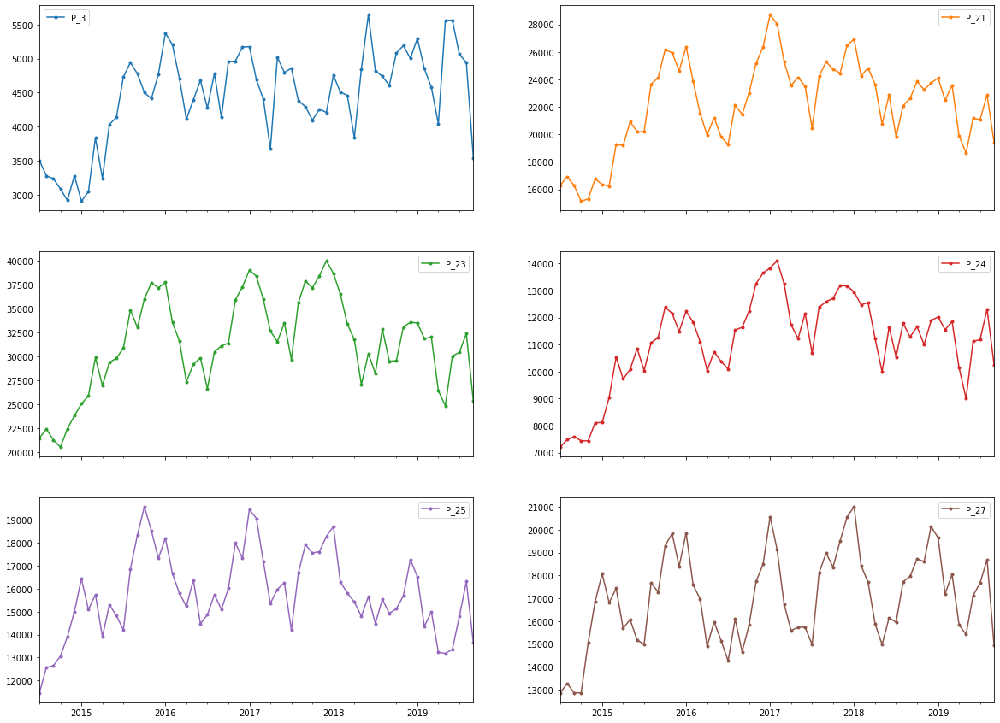

In [109]:
cluster_7.plot(subplots=True, layout=(3, 2), figsize=(20, 15), marker='.')
plt.show()

 Le corrélogramme suivant confirme la forte corrélation entre les produits, plus particulièrement les produits P_21, P_23 et P_24.

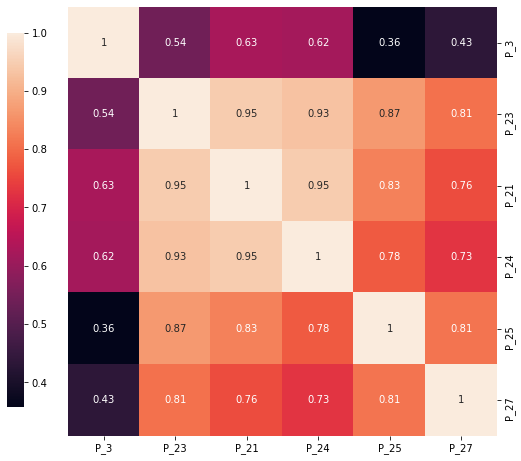

In [110]:
cg = sns.clustermap(cluster_7.corr(), figsize=(
    8, 8), cbar_pos=(.1, .1, .03, .65), annot=True)
cg.ax_row_dendrogram.set_visible(False)
cg.ax_col_dendrogram.set_visible(False)
plt.show()

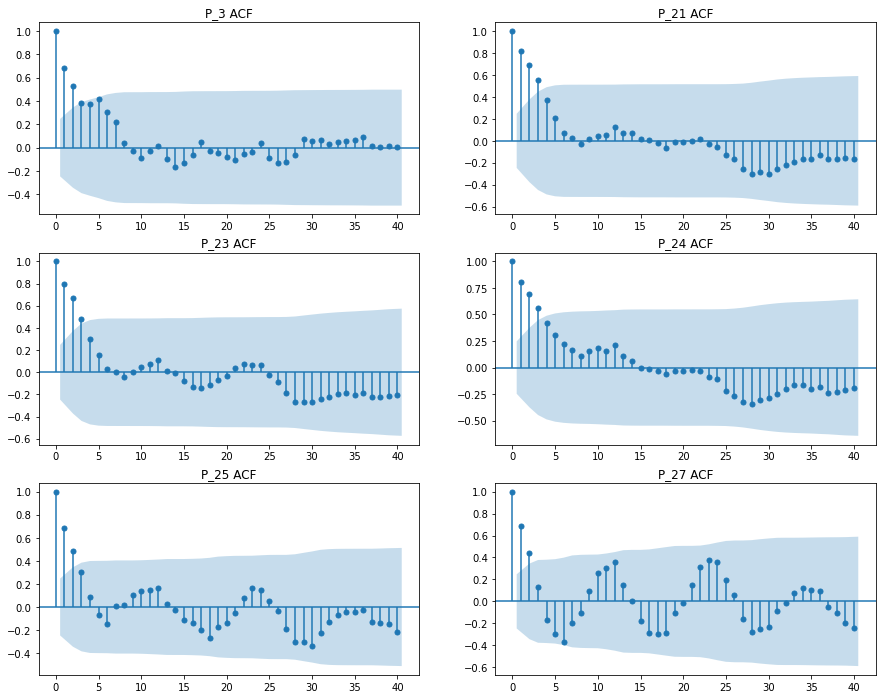

In [111]:
fig, axes = plt.subplots(3, 2, figsize=(15, 12), sharex=False)
remove_axes(len(cluster_7.columns), axes)
axs = axes.flatten()
alpha = .05
for i, col in enumerate(cluster_7.columns):
    sm.graphics.tsa.plot_acf(cluster_7[col].values.squeeze(
    ), lags=40, ax=axs[i], title=f"{col} ACF", alpha=alpha)

 D’une manière analogue à ARIMA, le modèle VARMA nécessite la stationnarité des séries temporelle. Pour vérifier la stationnarité, on a effectué les mêmes tests de racine unitaire et de saisonnalité, le tableau suivant synthétise les résultats.

In [112]:
multiple_test_all(cluster_7)

,Canova-Hansen,OCSB,Seasonality Order,ADF,KPSS,PP,differencing order
Series,,,,,,,
P_3,Non,Oui,1,Oui,Oui,Non,1
P_21,Non,Non,0,Oui,Oui,Oui,1
P_23,Non,Oui,1,Oui,Non,Oui,1
P_24,Non,Non,0,Oui,Oui,Oui,1
P_25,Non,Non,0,Non,Non,Oui,0
P_27,Non,Non,0,Non,Non,Non,0


 Après les différenciations nécessaires, on obtient les séries suivantes :

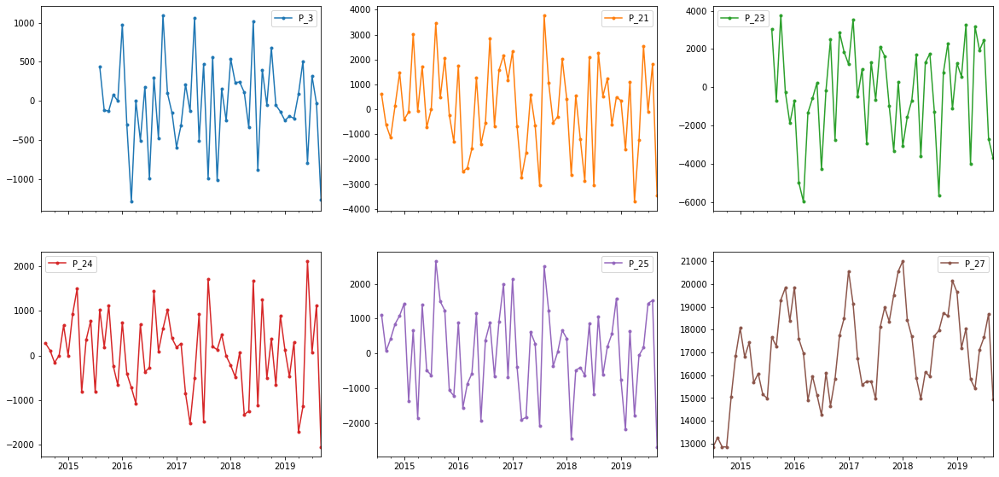

In [113]:
stationnarisation_summary = {}
for col in cluster_7.columns:
    stationnarisation_summary[col] = stationnarise(cluster_7[col])
cluster_7_stat = series_from_summary(stationnarisation_summary)
orders_7 = orders_from_summary(stationnarisation_summary)
cluster_7_stat.plot(subplots=True, layout=(3, 3), figsize=(20, 15), marker='.')
plt.show()

In [114]:
train_var = cluster_7.loc[:'2018-12-31']
test_var = cluster_7.loc['2019-01-31':]

 Pour trouver le meilleur modèle VARMA, on a utilisé le module AutoTS, qui fonctionne actuellement de la manière suivante :

 Le processus commence par le remodelage et le pré-traitement de données selon le besoin
 Un premier fractionnement train/test est généré où le test est de longueur 'Forecast_length'
 Le modèle initial est une combinaison d'apprentissage par transfert et de modèles générés aléatoirement. Ceci est testé sur le train/test initial
 Les modèles se composent d'une étape de pré-transformation (options de remplissage, options de suppression des valeurs aberrantes, etc.)
 Les meilleurs modèles (sélectionnés par une combinaison de métriques) sont recombinés avec des mutations aléatoires pour n_générations
 Un pourcentage des meilleurs modèles issus de ce processus est soumis à une validation croisée, où ils sont réévalués sur de nouvelles divisions train/test.
 S'il est utilisé, l'assemblage horizontal utilise les données de validation pour choisir le meilleur modèle pour chaque série.
 Le meilleur modèle ou ensemble en cours de validation est sélectionné comme best_model et utilisé dans la méthode .predict() pour générer des prévisions.

In [115]:
cluster_7_filename = "cluster_7_export.json"  # .csv/.json
best_model = AutoTS(frequency='M', max_generations=0,
                    num_validations=0, verbose=0)
try:
    best_model = best_model.import_template(
        cluster_7_filename, method='only', enforce_model_list=False)
    print("template found and imported")
except Exception:
    print("template not found", "Fitting new models ...", sep='\n')
    model = AutoTS(
        forecast_length=len(test_var),
        frequency='M',
        prediction_interval=0.95,
        model_list=["VARMAX"],
        ensemble="all",
        # transformer_list="fast",
        max_generations=8,
        num_validations=2,
        # models_to_validate=0.2,
        validation_method="backwards"
    )
    model.fit(train_var)
    model.export_template(cluster_7_filename, models='best', n=1)
    best_model = best_model.import_template(
        cluster_7_filename, method='only', enforce_model_list=False)
    print("models fitted and ready to predict",
          "template is saved to "+cluster_7_filename, sep='\n')

template found and imported


In [ ]:
best_model.fit(train_var)

In [117]:
prediction = best_model.predict(forecast_length=len(test_var))
forecast_cluster_7 = prediction.forecast
lower_forecast_cluster_7 = prediction.lower_forecast
upper_forecast_cluster_7 = prediction.upper_forecast

 Les prévisions par le modèle selectionné sur les séries donne les résultats suivants :

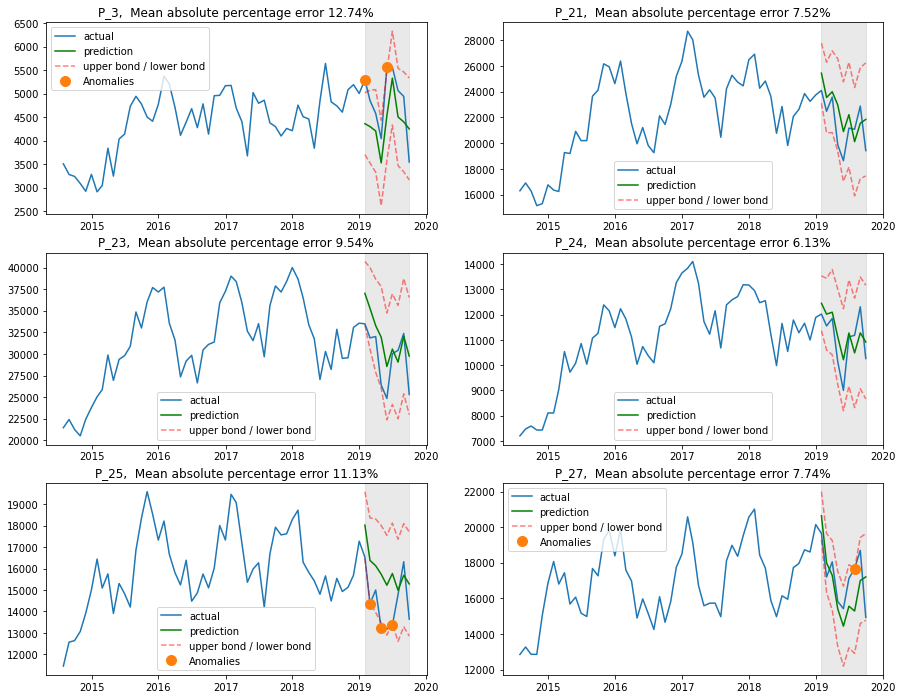

In [118]:
fig, axes = plt.subplots(3, 2, figsize=(15, 12), sharex=False)
remove_axes(len(forecast_cluster_7.columns), axes)
axs = axes.flatten()
alpha = .05
accuracies = pd.DataFrame(columns=cluster_7.columns, index=[
                          'mape', 'mae', 'rmse', 'mape_exces', 'mape_short'])
for i, col in enumerate(forecast_cluster_7.columns):
    axs[i].plot(cluster_7[col], label="actual")
    axs[i].plot(forecast_cluster_7[col], 'g', label="prediction")
    axs[i].plot(lower_forecast_cluster_7[col], "r--",
                label="upper bond / lower bond", alpha=0.5)
    axs[i].plot(upper_forecast_cluster_7[col], "r--", alpha=0.5)
    accuracies[col] = forecast_accuracy(forecast_cluster_7[col], test_var[col])
    axs[i].set_title(
        f"{col},  Mean absolute percentage error {accuracies[col]['mape']:.2f}%")
    axs[i].axvspan(forecast_cluster_7.index[0], forecast_cluster_7.index[-1],
                   color=sns.xkcd_rgb['grey'], alpha=0.2)

    anomalies = np.array([np.NaN]*len(test_var))
    anomalies[test_var[col] < lower_forecast_cluster_7[col]
              ] = test_var[col][test_var[col] < lower_forecast_cluster_7[col]]
    anomalies[test_var[col] > upper_forecast_cluster_7[col]
              ] = test_var[col][test_var[col] > upper_forecast_cluster_7[col]]
    anomalies_series = pd.Series(anomalies, index=forecast_cluster_7.index)
    if ~np.isnan(anomalies).all():
        axs[i].plot(anomalies_series, "o", markersize=10, label="Anomalies")
    axs[i].legend(loc="best")

In [119]:
accuracies

,P_3,P_21,P_23,P_24,P_25,P_27
mape,12.744583,7.517016e+00,9.541865e+00,6.134502,1.113281e+01,7.744473e+00
mae,605.866463,1.551336e+03,2.678322e+03,652.539397,1.561199e+03,1.315979e+03
rmse,423306.438991,3.055567e+06,1.022837e+07,544544.427794,2.990094e+06,2.161400e+06
mape_exces,17.328312,8.460721e+01,9.362288e+01,73.538215,9.615606e+01,3.571765e+01
mape_short,82.671688,1.539279e+01,6.377125e+00,26.461785,3.843942e+00,6.428235e+01
